In [1]:
import os
from participant_gaze_data_manager import ParticipantGazeDataManager

In [2]:
# extract all the names and groups of the participants from os folders names:

Noam_data_path = "/Volumes/ramot/Noam_M/Results/Behavior"

participants_dict = {"HC": [], "pwMS": []}
for group in ["HC", "pwMS"]:
    group_path = os.path.join(Noam_data_path, group)
    if os.path.isdir(group_path):
        for p_name in os.listdir(group_path):
            if p_name == "NN111":
                continue
            if os.path.isdir(os.path.join(group_path, p_name, "SDMT")):
                participants_dict[group].append(p_name)

print(participants_dict)

{'HC': ['OY974', 'KH736', 'PD922', 'LE750', 'LT157', 'TS512', 'EE050', 'FZ767', 'RO755', 'CN205', 'CS653', 'PG184', 'KT158', 'SA803', 'ZM425', 'VA784', 'RL823', 'YR187', 'DM242', 'YR573', 'VA725', 'SN975', 'SE304', 'LD965', 'SS408', 'KS856', 'KS689', 'KN566', 'LY082', 'PO515', 'BL238', 'BY165', 'AN814', 'HA186', 'KS130', 'PA981', 'PR454', 'AS778', 'BO921', 'GS739', 'YO399', 'SO754', 'PT914', 'GI702', 'AM367', 'DD328', 'LT752'], 'pwMS': ['GM552', 'ZA720', 'BR984', 'NG368', 'BR876', 'CM906', 'KT360', 'TM906', 'FS368', 'CN482', 'BA848', 'SM964', 'BV329', 'KD818', 'BR152', 'ZE374', 'ZS065', 'RV501', 'CR991', 'GO777', 'GT239', 'BY832', 'RD707', 'DN859', 'KM269', 'CA984', 'MK547', 'SR081', 'AS038', 'TS243', 'PA356', 'ED186', 'AG562', 'LM308', 'BA755', 'YS875', 'BN201', 'ZN290', 'NK494', 'ZL881', 'BD783', 'SI585', 'ST149', 'GR333', 'RS101', 'AA562', 'PM104', 'II318', 'KH607', 'OM743', 'FF688', 'DI192', 'KI485', 'KO801', 'ZC673', 'LS388', 'ST888', 'AP344', 'MI829', 'YN187', 'LA627', 'SD938', '

In [3]:
#count number of participants in each goup
from enum import unique


for group, names in participants_dict.items():
    print(f"Number of participants in group {group}: {len(names)}")

Number of participants in group HC: 47
Number of participants in group pwMS: 75


In [4]:
class Participant:
    def __init__(self, name, group):
        self.name = name
        self.group = group
        self.scores = {}
        self.trial_managers = None


    def add_score(self, panel_name, score):
        self.scores[panel_name] = score

In [5]:
import os
import re
import pandas as pd

# Initialize list
participants = []

# Path to the scores CSV
scores_csv_path = "/Volumes/ramot/Noam_M/preliminary_results/behavior_scores/all_scores.csv"

# OPTIMIZATION: Load the CSV once outside the loop instead of reading it 100 times
try:
    scores_df = pd.read_csv(scores_csv_path)
except Exception as e:
    print(f"Warning: Could not load global scores CSV: {e}")
    scores_df = pd.DataFrame() # Create empty DF so logic doesn't crash

# Loop through the dictionary you created in the previous cell
for group, names in participants_dict.items():
    for p_name in names:
        
        # 1. Create the Participant Object
        p_obj = Participant(p_name, group)
        
        # 2. Strategy A: Try Loading from CSV
        scores_found = False
        if not scores_df.empty:
            # Filter the big table for this specific person
            p_scores = scores_df[(scores_df["Group"] == group) & (scores_df["Participant"] == p_name)]
            
            if not p_scores.empty:
                for _, row in p_scores.iterrows():
                    # clean panel name
                    panel_name = str(row["Panel"]).strip().lower()
                    p_obj.add_score(panel_name, row["SDMT_Score"])
                scores_found = True

        # 3. Strategy B: Fallback to Parsing WAV files (if CSV failed)
        if not scores_found:
            sdmt_path = os.path.join(Noam_data_path, group, p_name, "SDMT")
            
            if os.path.exists(sdmt_path):
                for f in os.listdir(sdmt_path):
                    if f.endswith(".wav"):
                        # Regex extraction
                        pm = re.search(r"img_test_(.+?)_strikes", f)
                        sm = re.search(r"_strikes_(\d+)", f)
                        
                        if pm and sm:
                            clean_panel = pm.group(1).strip().lower()
                            score = int(sm.group(1))
                            p_obj.add_score(clean_panel, score)
        
        # 4. Append to final list
        participants.append(p_obj)

print(f"Successfully created {len(participants)} participant objects.")
# Sanity check: print first participant's scores
if participants:
    print(f"Sample ({participants[0].name}): {participants[0].scores}")

Successfully created 122 participant objects.
Sample (OY974): {'0': 44.0, 'i1': 53.0, 'l4': 53.0, 'a3': 51.0, 'a5': 51.0, 'l3': 50.0}


In [6]:
import traceback
from trial_manager import TrialManager

# New list to store only valid participants
valid_participants = []

for participant in participants:
    p_name = participant.name
    group = participant.group
    
    participant.trial_managers = {} 
    
    has_any_data = False

    try:
        # Optimization: Initialize DataManager ONCE per participant, not inside the panel loop
        participant_data = ParticipantGazeDataManager(p_name, Noam_data_path, "SDMT", group)
        
        for panel in participant.scores.keys():
            try:
                # Try to create the Trial Manager for this specific panel
                trial_manager = TrialManager(participant_data, panel)
                
                # Store in dictionary
                participant.trial_managers[panel] = trial_manager
                has_any_data = True
                
            except Exception as e:
                print(f"  Error loading {p_name} - {panel}: {e}")
                # print(traceback.format_exc())  # This prints the full stack trace
                pass

    except Exception as e:
        print(f"Could not load data manager for {p_name}: {e}")

    # Only keep the participant if they have at least one valid panel
    if has_any_data:
        valid_participants.append(participant)
    else:
        print(f"Removing {p_name} (No valid data found for any panel)")

# Update the main list
participants = valid_participants
print(f"Final number of participants: {len(participants)}")

  Error loading PD922 - i1: 'i1'
  Error loading PD922 - l4: 'l4'
  Error loading PD922 - a5: 'a5'
  Error loading TS512 - i1: 'i1'
  Error loading TS512 - l4: 'l4'
  Error loading TS512 - a5: 'a5'
  Error loading EE050 - 0: '0'
  Error loading EE050 - a3: 'a3'
  Error loading EE050 - l3: 'l3'
Could not load data manager for KT158: Too many NaN values in panel 1 for dominant eye 'r'
Removing KT158 (No valid data found for any panel)
Could not load data manager for ZM425: Expecting matrix here
Removing ZM425 (No valid data found for any panel)
  Error loading VA784 - i1: 'i1'
  Error loading VA784 - l4: 'l4'
  Error loading VA784 - a5: 'a5'
Could not load data manager for RL823: Too many NaN values in panel 1 for dominant eye 'r'
Removing RL823 (No valid data found for any panel)
Could not load data manager for YR187: Too many NaN values in panel 3 for dominant eye 'r'
Removing YR187 (No valid data found for any panel)
Could not load data manager for DM242: Too many NaN values in panel 

In [7]:
print(f"Sample: {participants[0].name} has {len(participants[0].trial_managers)} panels loaded.")

Sample: OY974 has 6 panels loaded.


OY974 - 0: Valid Trials = 42 / 42
OY974 - i1: Valid Trials = 51 / 51
OY974 - l4: Valid Trials = 51 / 51
OY974 - a3: Valid Trials = 49 / 49
OY974 - a5: Valid Trials = 49 / 49
OY974 - l3: Valid Trials = 48 / 48
KH736 - 0: Valid Trials = 63 / 63
KH736 - i1: Valid Trials = 59 / 67
KH736 - l4: Valid Trials = 65 / 69
KH736 - a3: Valid Trials = 64 / 64
KH736 - a5: Valid Trials = 59 / 67
KH736 - l3: Valid Trials = 65 / 65
PD922 - 0: Valid Trials = 51 / 51
PD922 - a3: Valid Trials = 52 / 52
PD922 - l3: Valid Trials = 53 / 53
LE750 - 0: Valid Trials = 0 / 0
LE750 - i1: Valid Trials = 0 / 0
LE750 - l4: Valid Trials = 0 / 0
LE750 - a3: Valid Trials = 0 / 0
LE750 - a5: Valid Trials = 0 / 0
LE750 - l3: Valid Trials = 0 / 0
LT157 - 0: Valid Trials = 0 / 0
LT157 - i1: Valid Trials = 0 / 0
LT157 - l4: Valid Trials = 0 / 0
LT157 - a3: Valid Trials = 0 / 0
LT157 - a5: Valid Trials = 0 / 0
LT157 - l3: Valid Trials = 0 / 0
TS512 - 0: Valid Trials = 55 / 55
TS512 - a3: Valid Trials = 62 / 62
TS512 - l3: Val

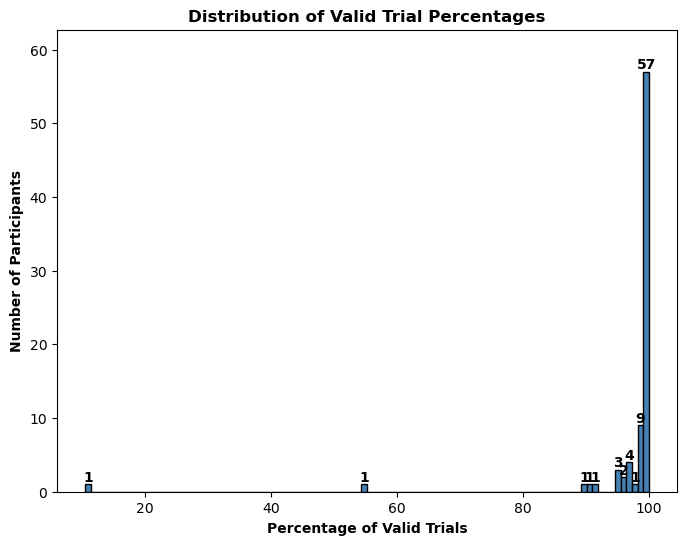

In [22]:
import math
import matplotlib.pyplot as plt

percentages = []

for participant in participants:
    total_trials = 0
    valid_trials = 0
    
    for panel, tm in participant.trial_managers.items():
        panel_trials = len(tm.trials)
        total_trials += panel_trials
        
        # Correctly check for NaN using the math library
        panel_valid_trials = sum(
            1 for t in tm.trials 
            if not (math.isnan(t.start_time) or math.isnan(t.end_time))
        )
        
        valid_trials += panel_valid_trials
        print(f"{participant.name} - {panel}: Valid Trials = {panel_valid_trials} / {panel_trials}")
    
    if total_trials > 0:
        percentage = (valid_trials / total_trials) * 100
        percentages.append(percentage)

# Plot histogram and capture the bar data
plt.figure(figsize=(8, 6))
counts, bins, patches = plt.hist(percentages, bins=100, edgecolor='black', color='steelblue')

# Annotate each bar with the number of participants
for count, patch in zip(counts, patches):
    if count > 0:  # Prevent labeling empty bins
        plt.text(patch.get_x() + patch.get_width() / 2, 
                 patch.get_height(), 
                 str(int(count)), 
                 ha='center', va='bottom', fontweight='bold')

plt.title('Distribution of Valid Trial Percentages', fontweight='bold')
plt.xlabel('Percentage of Valid Trials', fontweight='bold')
plt.ylabel('Number of Participants', fontweight='bold')

# Expand y-axis limit dynamically by 10% to fit the top labels
plt.ylim(0, max(counts) * 1.1) 
plt.show()

In [8]:
import os
import pickle

# 1. Define folder to save the participant objects
# Using a dedicated folder keeps things clean
cache_dir = os.path.join(Noam_data_path, "full_participants_cache")
os.makedirs(cache_dir, exist_ok=True)

print(f"Saving {len(participants)} participants to: {cache_dir}")

for p in participants:
    # Create a unique filename using Name and Group
    filename = f"{p.name}_{p.group}.pkl"
    save_path = os.path.join(cache_dir, filename)
    
    try:
        with open(save_path, 'wb') as f:
            pickle.dump(p, f)
    except Exception as e:
        print(f"Error saving {p.name}: {e}")

print("--- Save Complete ---")

Saving 94 participants to: /Volumes/ramot/Noam_M/Results/Behavior/full_participants_cache
--- Save Complete ---


In [84]:
import os
import pickle

# 1. Define the folder to read from
cache_dir = os.path.join(Noam_data_path, "full_participants_cache")

# 2. Start a fresh list
participants_from_cache = []

print(f"Loading participants from: {cache_dir}...")

if os.path.exists(cache_dir):
    # Iterate over every .pkl file in the directory
    for filename in os.listdir(cache_dir):
        if filename.endswith(".pkl"):
            file_path = os.path.join(cache_dir, filename)
            
            try:
                with open(file_path, 'rb') as f:
                    p_obj = pickle.load(f)
                    participants_from_cache.append(p_obj)
            except Exception as e:
                print(f"Error loading {filename}: {e}")
else:
    print("Cache directory not found. Please run the 'Save' block first.")

print(f"--- Loaded {len(participants_from_cache)} participants ---")

# Optional: Verify data exists
if participants_from_cache:
    print(f"Sample: {participants_from_cache[0].name} has {len(participants_from_cache[0].trial_managers)} panels loaded.")

Loading participants from: /Volumes/ramot/Noam_M/Results/Behavior/full_participants_cache...
--- Loaded 94 participants ---
Sample: PA356 has 6 panels loaded.


In [15]:
import numpy as np

def smart_verify(original_list, loaded_list):
    print("--- Smart Verification (Ignoring NaNs & Objects) ---")
    
    orig_dict = {p.name: p for p in original_list}
    load_dict = {p.name: p for p in loaded_list}
    
    errors = []
    
    for name, p_mem in orig_dict.items():
        if name not in load_dict: continue
        p_dsk = load_dict[name]

        # -------------------------------------------------
        # 1. CHECK SCORES (Handle NaN correctly)
        # -------------------------------------------------
        all_panels = set(p_mem.scores.keys()) | set(p_dsk.scores.keys())
        for panel in all_panels:
            s1 = p_mem.scores.get(panel, np.nan)
            s2 = p_dsk.scores.get(panel, np.nan)
            
            # Match if: Both are numbers and equal OR Both are NaN
            is_match = (s1 == s2) or (np.isnan(s1) and np.isnan(s2))
            
            if not is_match:
                errors.append(f"{name} Score [{panel}]: {s1} != {s2}")

        # -------------------------------------------------
        # 2. CHECK SEQUENCES (Compare Content, not Objects)
        # -------------------------------------------------
        for panel, tm_mem in p_mem.trial_managers.items():
            if panel not in p_dsk.trial_managers:
                errors.append(f"{name} Manager [{panel}]: Missing in disk")
                continue
                
            tm_dsk = p_dsk.trial_managers[panel]
            
            # Check Trial Count
            if len(tm_mem.trials) != len(tm_dsk.trials):
                errors.append(f"{name} Trial Count [{panel}]: {len(tm_mem.trials)} != {len(tm_dsk.trials)}")
                continue

            # Check Sequences by converting to STRING (Ignores memory address)
            for i, (t1, t2) in enumerate(zip(tm_mem.trials, tm_dsk.trials)):
                for s1, s2 in zip(t1.searches, t2.searches):
                    seq1 = str(getattr(s1, 'sequence', []))
                    seq2 = str(getattr(s2, 'sequence', []))
                    
                    if seq1 != seq2:
                        errors.append(f"{name} Seq [{panel}] T{i}: Content Mismatch")
                        break
                else:
                    continue
                break

    if not errors:
        print("✅ SUCCESS: All data matches (ignoring NaN identity and object instances).")
    else:
        print(f"❌ FAIL: Found {len(errors)} real mismatches.")
        for e in errors[:5]: print(e)

# Run the smart check
smart_verify(participants, participants_from_cache)

--- Smart Verification (Ignoring NaNs & Objects) ---
✅ SUCCESS: All data matches (ignoring NaN identity and object instances).


In [85]:
participants = participants_from_cache

In [33]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Container for the line plot (Trial-level data)
trial_duration_data = []

# Container for the scatter plot (Participant-level data)
participant_duration_data = []

#-------------------- FROM MEMORY PARTICIPANTS --------------------
participants = participants_from_cache
#------------------------------------------------------------------

for p in participants:
    # 1. Calculate Mean Score (averaged over valid panels)
    scores = [s for s in p.scores.values() if not np.isnan(s)]
    mean_score = np.mean(scores) if scores else np.nan
    
    all_p_durations = []
    
    # 2. Iterate Panels
    for panel, tm in p.trial_managers.items():
        
        # 3. Iterate Trials
        for trial_idx, trial in enumerate(tm.trials):
            trial_durations = []
            trial_dwells = []
            
            # 4. Iterate Searches -> Fixations
            if hasattr(trial, 'searches'):
                for s in trial.searches:
                    # A. FIXATION DURATIONS
                    if hasattr(s, 'fixations') and s.fixations:
                        for f in s.fixations:
                            # FIXED: Removed () from duration, it is an attribute
                            if f and hasattr(f, 'duration') and f.duration() > 0:
                                trial_durations.append(f.duration() / 1000)
                                all_p_durations.append(f.duration() / 1000)
                    
                    # B. SYMBOL DWELL TIMES
                    if hasattr(s, "sequence") and s.sequence:
                        last_symbol = None
                        start_time = None
                        end_time = None
                        
                        # Iterate through the dictionary items (Fixation -> Symbol)
                        for fixation, symbol in s.sequence.items():
                            
                            # CASE 1: Same symbol as before (Extend the dwell)
                            if symbol == last_symbol:
                                end_time = fixation.end_time
                                continue
                            
                            # CASE 2: New symbol found (Switch)
                            if last_symbol is not None:
                                duration = end_time - start_time
                                if duration > 0:
                                    # FIXED: Added /1000 to match units with fixation duration
                                    trial_dwells.append(duration / 1000)
                            
                            # Start tracking new symbol
                            last_symbol = symbol
                            start_time = fixation.start_time
                            end_time = fixation.end_time
                        
                        # CASE 3: Commit the final symbol
                        if last_symbol is not None and start_time is not None:
                            duration = end_time - start_time
                            if duration > 0:
                                # FIXED: Added /1000 here too
                                trial_dwells.append(duration / 1000)

            # Record trial-level mean (for the Line Plot)
            if trial_durations:
                mean_trial_dur = np.mean(trial_durations)
                
                # FIXED: Handle case where dwells might be empty to avoid np.mean error
                mean_trial_symbol_dur = np.mean(trial_dwells) if trial_dwells else np.nan
                
                trial_duration_data.append({
                    "Participant": p.name,
                    "Group": p.group,
                    "Panel": panel,
                    "Trial_Index": trial_idx,
                    "Mean_Duration_ms": mean_trial_dur,
                    "Mean_Symbol_fixation_Duration_ms": mean_trial_symbol_dur
                })

    # Record participant-level grand mean (for the Scatter Plot)
    if all_p_durations and not np.isnan(mean_score):
        participant_duration_data.append({
            "Participant": p.name,
            "Group": p.group,
            "Mean_Score": mean_score,
            "Grand_Mean_Duration_ms": np.mean(all_p_durations),
            # "Grand_Mean_Symbol_fixation_Duration_ms": np.mean(trial_dwells)
        })

# Convert to DataFrames
df_line = pd.DataFrame(trial_duration_data)
df_scatter = pd.DataFrame(participant_duration_data)

print(f"Extraction complete. Scatter points: {len(df_scatter)}, Line points: {len(df_line)}")

Extraction complete. Scatter points: 81, Line points: 24302


In [ ]:
# 1. Total participants per group
total_per_group = df_line.groupby("Group")["Participant"].nunique()

# 2. Participants present at each trial per group
trial_counts = df_line.groupby(["Trial_Index", "Group"])["Participant"].nunique()

# 3. Find the cutoff
cutoff_trial = None

# Iterate through trials in order
for trial in sorted(df_line["Trial_Index"].unique()):
    # Check both groups for this trial
    groups_ok = True
    global_threshold = 0.8 * total_per_group.sum()  # 80% of total participants across both groups
    print(f"global threshold: {global_threshold}")
    for group in ["HC", "pwMS"]:
        # Get count for this trial/group (default to 0 if missing)
        count = trial_counts.get((trial, group), 0)
        threshold = total_per_group[group] * 0.8
        print(f"the threshold for group {group} is {threshold}")
        
        if count < threshold:
            groups_ok = False
            break
    
    if not groups_ok:
        cutoff_trial = trial
        break

if cutoff_trial is not None:
    print(f"The cutoff is Trial {cutoff_trial}.")
    print(f"(At Trial {cutoff_trial}, at least one group dropped below 80% participation.)")
    print(f"You should plot trials 0 to {cutoff_trial - 1}.")
else:
    print("All trials have >80% participation for both groups.")

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. EXTRACT DATA: Total Symbol Count (Sequence Length) ---
symbol_count_data = []

print("--- Extracting Total Symbol Counts (Sequence Length) ---")

for p in participants:
    # Iterate Panels
    for panel, tm in p.trial_managers.items():
        # Iterate Trials
        for trial_idx, trial in enumerate(tm.trials):
            
            # Calculate Total Count (Length of sequence)
            trial_total_count = 0
            
            if hasattr(trial, 'searches'):
                for s in trial.searches:
                    # Priority: Use 'cleaned_sequence' if available (as requested)
                    if hasattr(s, 'cleaned_sequence') and s.cleaned_sequence:
                        trial_total_count += len(s.cleaned_sequence)
                    # Fallback: Use raw 'sequence' dictionary if cleaned is missing
                    # elif hasattr(s, 'sequence') and s.sequence:
                    #     print(f"Warning: Using raw sequence for {p.name} - {panel} Trial {trial_idx} (cleaned_sequence missing)")
                    #     print(f"Raw sequence length: {s.sequence.values()}")
                    #     trial_total_count += len(s.sequence)
            
            # Append Record
            symbol_count_data.append({
                "Participant": p.name,
                "Group": p.group,
                "Panel": panel,
                "Trial_Index": trial_idx,
                "Total_Symbols_Count": trial_total_count
            })

df_symbols = pd.DataFrame(symbol_count_data)

# --- 2. AGGREGATE PER PARTICIPANT (Mean across their panels) ---
df_participant_mean = df_symbols.groupby(["Participant", "Group", "Trial_Index"])["Total_Symbols_Count"].mean().reset_index()

# --- 3. FILTER CUTOFF (<80% Participation) ---
total_participants = df_participant_mean["Participant"].nunique()
global_threshold = total_participants * 0.8

print(f"Total Participants: {total_participants}")
print(f"Global Cutoff Threshold (80%): {global_threshold:.1f}")

trial_counts = df_participant_mean.groupby("Trial_Index")["Participant"].nunique()
cutoff_trial = df_participant_mean["Trial_Index"].max() + 1 

for trial_idx, count in trial_counts.sort_index().items():
    if count < global_threshold:
        cutoff_trial = trial_idx
        print(f"--> Cutoff triggered at Trial {trial_idx} (Count: {count})")
        break

df_filtered = df_participant_mean[df_participant_mean["Trial_Index"] < cutoff_trial].copy()

# --- 4. PLOT ---
plt.figure(figsize=(12, 6))

sns.lineplot(data=df_filtered, x="Trial_Index", y="Total_Symbols_Count", hue="Group",
             palette={"HC": "blue", "pwMS": "red"},
             errorbar='se') 
# +- SEM
plt.title("Mean Number of Symbols Visited per Trial (Mean ± SEM)", fontsize=16)
plt.xlabel("Trial Number")
plt.ylabel("Total Symbols Count")
plt.legend(title="Group", fontsize='xx-small', title_fontsize='xx-small')
plt.grid(True, alpha=0.3)
plt.show()

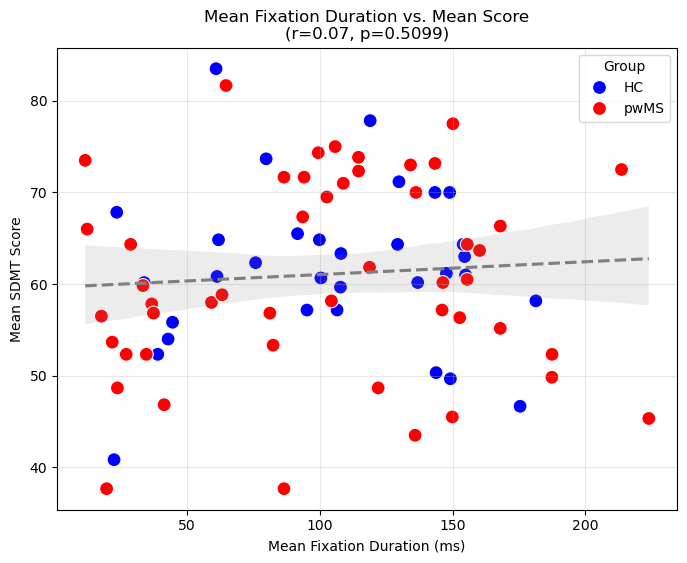

In [32]:
plt.figure(figsize=(8, 6))

# Plot
sns.scatterplot(data=df_scatter, x="Grand_Mean_Duration_ms", y="Mean_Score", 
                hue="Group", palette={"HC": "blue", "pwMS": "red"}, s=100)

# Regression Line (Global)
sns.regplot(data=df_scatter, x="Grand_Mean_Duration_ms", y="Mean_Score", 
            scatter=False, color="gray", line_kws={"linestyle": "--"})

# Stats
r, p_val = pearsonr(df_scatter["Grand_Mean_Duration_ms"], df_scatter["Mean_Score"])

plt.title(f"Mean Fixation Duration vs. Mean Score\n(r={r:.2f}, p={p_val:.4f})")
plt.xlabel("Mean Fixation Duration (ms)")
plt.ylabel("Mean SDMT Score")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))

# Line plot with Standard Deviation shading
sns.lineplot(data=df_line, x="Trial_Index", y="Mean_Duration_ms", hue="Group",
             palette={"HC": "blue", "pwMS": "red"},
             errorbar='se') # 'sd' = Standard Deviation (Variance spread), 'ci' = 95% Conf. Interval

plt.title("Mean Fixation Duration per Trial (Across All Panels)")
plt.xlabel("Trial Number")
plt.ylabel("Fixation Duration (ms)")
plt.legend(title="Group")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))

# Line plot with Standard Deviation shading
sns.lineplot(data=df_line, x="Trial_Index", y="Mean_Symbol_fixation_Duration_ms", hue="Group",
             palette={"HC": "blue", "pwMS": "red"},
             errorbar='se') # 'sd' = Standard Deviation (Variance spread), 'ci' = 95% Conf. Interval

plt.title("Mean Fixation Duration per Trial (Across All Panels)")
plt.xlabel("Trial Number")
plt.ylabel("Fixation Duration (ms)")
plt.legend(title="Group")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Calculate Thresholds per Group
# Count total unique participants per group
group_counts = df_line.groupby("Group")["Participant"].nunique()

print("--- 80% Cutoff Thresholds ---")
thresholds = {}
for group, count in group_counts.items():
    thresholds[group] = count * 0.8
    print(f"{group}: Total={count}, Cutoff={thresholds[group]:.1f}")

# 2. Filter Data
# Count how many participants exist for each (Group, Trial_Index) bin
trial_counts = df_line.groupby(["Group", "Trial_Index"])["Participant"].nunique().reset_index(name="N_Present")

# Merge these counts back into the main dataframe so we can filter rows
df_merged = df_line.merge(trial_counts, on=["Group", "Trial_Index"])

# Apply the filter: Keep row ONLY if N_Present >= 80% of that Group's total
# We use a lambda to check the specific threshold for the row's group
df_filtered = df_merged[df_merged.apply(lambda row: row["N_Present"] >= thresholds[row["Group"]], axis=1)]

print(f"Original data points: {len(df_line)}")
print(f"Filtered data points: {len(df_filtered)}")

# 3. Plot
plt.figure(figsize=(12, 6))

sns.lineplot(data=df_filtered, x="Trial_Index", y="Mean_Symbol_fixation_Duration_ms", hue="Group",
             palette={"HC": "blue", "pwMS": "red"},
             errorbar='se') 

plt.title("Mean Symbol Dwell Time per Trial\n(Cutoff: Data points with <80% participant retention removed)")
plt.xlabel("Trial Number")
plt.ylabel("Dwell Time (ms)")
plt.legend(title="Group")
plt.grid(True, alpha=0.3)
plt.show()

Loading data from: /Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv


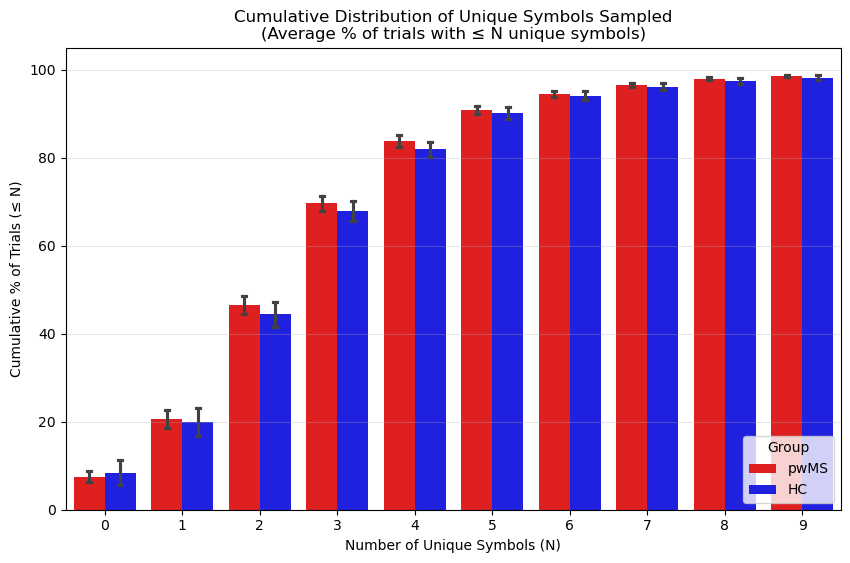

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_cumulative_from_csv(csv_path):
    print(f"Loading data from: {csv_path}")
    
    # 1. Load Data
    df = pd.read_csv(csv_path)

    # 2. Filter for Percentage rows only
    # (We aggregate the 'PDF' percentages first, then cumsum them)
    df = df[df["Measure"] == "Percentage"].copy()

    # 3. Collapse Panels: Calculate one average distribution per participant
    # This averages the % for "0 unique", "1 unique"... across all panels for each person
    df_part = df.groupby(["Participant", "Group", "N_Unique_Symbols"])["Value"].mean().reset_index()

    # 4. Calculate Cumulative Sum (CDF) per Participant
    # We sort by N (0->9) so the cumsum works correctly
    df_part.sort_values(by=["Participant", "N_Unique_Symbols"], inplace=True)
    df_part["Cumulative_Percentage"] = df_part.groupby("Participant")["Value"].cumsum()

    # 5. Plot
    plt.figure(figsize=(10, 6))
    
    # Barplot automatically calculates the Mean + Standard Error across participants for each bin
    sns.barplot(data=df_part, x="N_Unique_Symbols", y="Cumulative_Percentage", hue="Group",
                palette={"HC": "blue", "pwMS": "red"},
                errorbar=('se', 1), capsize=0.1)

    plt.title("Cumulative Distribution of Unique Symbols Sampled\n(Average % of trials with ≤ N unique symbols)")
    plt.xlabel("Number of Unique Symbols (N)")
    plt.ylabel("Cumulative % of Trials (≤ N)")
    plt.ylim(0, 105) 
    plt.grid(True, axis='y', alpha=0.3)
    plt.legend(title="Group", loc="lower right")
    plt.show()

# Run
path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv"
plot_cumulative_from_csv(path)

Loading data from: /Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv

--- Statistics (HC vs MS) ---
P-values (FDR Corrected): {0: np.float64(0.7473060928061541), 1: np.float64(0.5011322744868317), 2: np.float64(0.5011322744868317)}


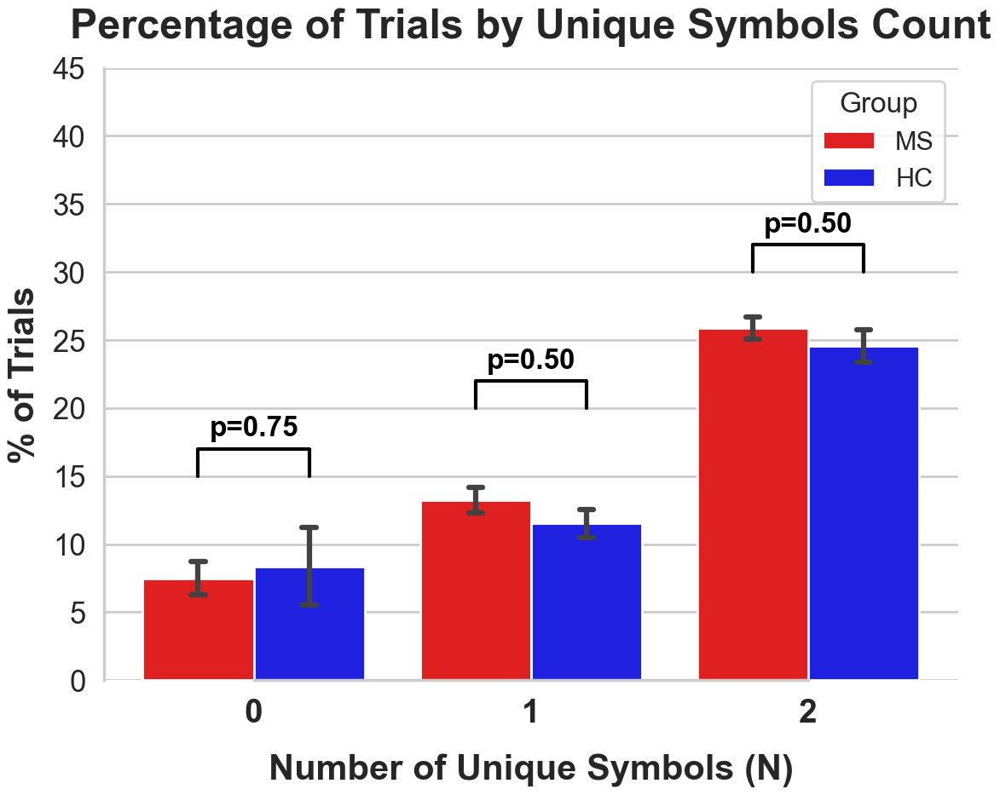

In [67]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import numpy as np

# --- 1. LOAD AND PREPARE DATA ---
csv_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv"

try:
    print(f"Loading data from: {csv_path}")
    df = pd.read_csv(csv_path)
    df["Group"] = df["Group"].astype(str).str.strip().replace({"pwMS": "MS"})
    df = df[df["Measure"] == "Percentage"].copy()
    df_part = df.groupby(["Participant", "Group", "N_Unique_Symbols"])["Value"].mean().reset_index()
    df_subset = df_part[df_part["N_Unique_Symbols"].isin([0, 1, 2])].copy()

except Exception as e:
    print(f"Error loading data: {e}")
    df_subset = pd.DataFrame()

# --- 2. STATS & PLOTTING ---
if not df_subset.empty:
    sns.set_context("poster", font_scale=1.2)
    sns.set_style("whitegrid")
    
    levels = [0, 1, 2]
    p_values = []
    
    # A. Calculate T-Tests
    print("\n--- Statistics (HC vs MS) ---")
    for level in levels:
        hc_vals = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == "HC")]["Value"].dropna()
        ms_vals = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == "MS")]["Value"].dropna()
        
        if len(hc_vals) > 1 and len(ms_vals) > 1:
            t, p = ttest_ind(hc_vals, ms_vals)
            p_values.append(p)
        else:
            p_values.append(np.nan)

    # B. FDR Correction
    clean_p = [p for p in p_values if not np.isnan(p)]
    if clean_p:
        reject, corrected_p_list, _, _ = multipletests(clean_p, alpha=0.05, method='fdr_bh')
        final_p_map = {}
        idx = 0
        for i, p in enumerate(p_values):
            if not np.isnan(p):
                final_p_map[levels[i]] = corrected_p_list[idx]
                idx += 1
            else:
                final_p_map[levels[i]] = np.nan
        print(f"P-values (FDR Corrected): {final_p_map}")
    else:
        final_p_map = {l: np.nan for l in levels}

    # C. Plotting
    plt.figure(figsize=(12, 10))
    
    ax = sns.barplot(data=df_subset, x="N_Unique_Symbols", y="Value", hue="Group",
                     order=levels,
                     palette={"HC": "blue", "MS": "red"}, 
                     errorbar=('se', 1), capsize=0.1)
    
    # D. Add Significance Markers (MANUAL POSITIONS)
    # Define exact Y-positions for each x-axis level (0, 1, 2)
    manual_y_positions = {
        0: 15,  # Bracket start for N=0
        1: 20,  # Bracket start for N=1
        2: 30   # Bracket start for N=2
    }
    bracket_h = 2  # Height of bracket legs

    for i, level in enumerate(levels):
        p_val = final_p_map.get(level, np.nan)
        if np.isnan(p_val): continue
        
        # Get manually set Y position
        y = manual_y_positions[level]

        # Symbol
        if p_val < 0.001: sig_symbol = "***"
        elif p_val < 0.01: sig_symbol = "**"
        elif p_val < 0.05: sig_symbol = "*"
        else: sig_symbol = f"p={p_val:.2f}"
        
        # Draw bracket
        x1, x2 = i - 0.2, i + 0.2
        plt.plot([x1, x1, x2, x2], [y, y + bracket_h, y + bracket_h, y], lw=3, c='k')
        plt.text(i, y + bracket_h + 0.5, sig_symbol, ha='center', va='bottom', 
                 color='k', fontsize=24, fontweight='bold')

    # E. Formatting
    plt.title("Percentage of Trials by Unique Symbols Count", fontsize=35, fontweight='bold', pad=25)
    plt.xlabel("Number of Unique Symbols (N)", fontsize=30, fontweight='bold', labelpad=20)
    plt.ylabel("% of Trials", fontsize=30, fontweight='bold', labelpad=10)
    
    plt.xticks(fontsize=28, fontweight='bold')
    plt.yticks(fontsize=25)
    plt.legend(title="Group", fontsize=22, title_fontsize=24, loc='upper right')
    
    plt.ylim(0, 45)
    
    sns.despine(trim=True)
    plt.tight_layout()
    plt.show()

else:
    print("No data found for 0, 1, or 2 unique symbols.")

Loading behavioral data from: /Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv
Loading SDMT scores from: /Volumes/ramot/WIS_IDO/Results/Analysis/Behavior/Final_Results_By_Date/260101/df_nontrash_behavioral_summary_20260129_091443.xlsx
       'SOC', 'IN_7TMS', 'IN_SOC', 'IS_SOC_ONLY',
       ...
       'Stroop_RT_I_All', 'Stroop_RT_X_Correct', 'Stroop_RT_C_Correct',
       'Stroop_RT_I_Correct', 'Stroop_Interference_RT_Correct',
       'Stroop_Interference_RT_All', 'Stroop_Interference_Acc',
       'MW_Typ_Grand_vsallmw', 'MW_Typ_Social_vsallmw',
       'MW_Typ_Object_vsallmw'],
      dtype='object', length=146). Using 'Patient_ID' if available.
Bottom 20% Cutoff (SDMT): <= 52.83 (n=24)
Top 20% Cutoff (SDMT): >= 70.17 (n=24)

--- Statistics (Bottom 20% vs Top 20%) ---
P-values (FDR Corrected): {0: np.float64(0.1955926727842361), 1: np.float64(0.048959376445192396), 2: np.float64(0.00412955933276

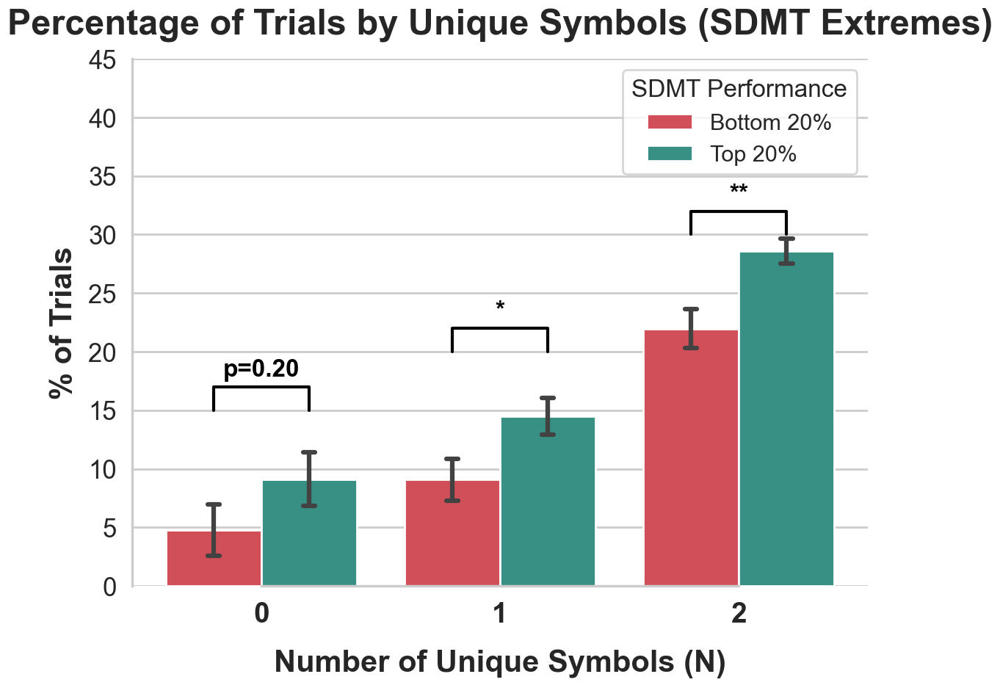

In [72]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import numpy as np

# --- 1. LOAD DATA ---
csv_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv"
sdmt_excel_path = "/Volumes/ramot/WIS_IDO/Results/Analysis/Behavior/Final_Results_By_Date/260101/df_nontrash_behavioral_summary_20260129_091443.xlsx"

try:
    print(f"Loading behavioral data from: {csv_path}")
    df = pd.read_csv(csv_path)
    df = df[df["Measure"] == "Percentage"].copy()
    
    # --- 2. DEFINE GROUPS BY SDMT (FROM EXCEL) ---
    print(f"Loading SDMT scores from: {sdmt_excel_path}")
    df_sdmt = pd.read_excel(sdmt_excel_path)
    
    # Data Cleaning: Ensure 'Participant' columns match (convert to string/strip)
    # NOTE: Check if the column is named 'Participant' in your Excel. If it's 'subject_id', change it here.
    if "Participant" not in df_sdmt.columns:
         # Fallback: try to find a likely column or raise error
         possible_cols = [c for c in df_sdmt.columns if "Patient_ID" in c]
         print(f"Warning: 'Participant' column not found in Excel. Available columns: {df_sdmt.columns}. Using '{possible_cols[0]}' if available.")
         if possible_cols:
             df_sdmt = df_sdmt.rename(columns={possible_cols[0]: "Participant"})
    
    df["Participant"] = df["Participant"].astype(str).str.strip()
    df_sdmt["Participant"] = df_sdmt["Participant"].astype(str).str.strip()

    # Drop missing SDMT scores and duplicates
    sdmt_scores = df_sdmt.dropna(subset=["SDMT_Mean"]).copy()
    # Ensure one score per participant (if duplicates exist, take the first or mean)
    sdmt_scores = sdmt_scores.groupby("Participant")["SDMT_Mean"].mean().reset_index()

    # Calculate Thresholds (20th and 80th percentiles)
    lower_cutoff = sdmt_scores["SDMT_Mean"].quantile(0.20)
    upper_cutoff = sdmt_scores["SDMT_Mean"].quantile(0.80)
    
    # Identify Participants
    bottom_20_ids = sdmt_scores[sdmt_scores["SDMT_Mean"] <= lower_cutoff]["Participant"].values
    top_20_ids = sdmt_scores[sdmt_scores["SDMT_Mean"] >= upper_cutoff]["Participant"].values
    
    print(f"Bottom 20% Cutoff (SDMT): <= {lower_cutoff:.2f} (n={len(bottom_20_ids)})")
    print(f"Top 20% Cutoff (SDMT): >= {upper_cutoff:.2f} (n={len(top_20_ids)})")

    # Filter Main Data using the IDs found in the Excel
    df_bottom = df[df["Participant"].isin(bottom_20_ids)].copy()
    df_bottom["Group"] = "Bottom 20%"
    
    df_top = df[df["Participant"].isin(top_20_ids)].copy()
    df_top["Group"] = "Top 20%"
    
    # Combine
    df_combined = pd.concat([df_bottom, df_top])
    
    # Aggregate for plotting (Mean per participant first)
    df_part = df_combined.groupby(["Participant", "Group", "N_Unique_Symbols"])["Value"].mean().reset_index()
    df_subset = df_part[df_part["N_Unique_Symbols"].isin([0, 1, 2])].copy()

except Exception as e:
    print(f"Error processing data: {e}")
    df_subset = pd.DataFrame()

# --- 3. STATS & PLOTTING ---
if not df_subset.empty:
    sns.set_context("poster", font_scale=1.2)
    sns.set_style("whitegrid")
    
    levels = [0, 1, 2]
    group_low = "Bottom 20%"
    group_high = "Top 20%"
    
    p_values = []
    
    # A. Calculate T-Tests
    print(f"\n--- Statistics ({group_low} vs {group_high}) ---")
    for level in levels:
        vals_low = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == group_low)]["Value"].dropna()
        vals_high = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == group_high)]["Value"].dropna()
        
        if len(vals_low) > 1 and len(vals_high) > 1:
            t, p = ttest_ind(vals_low, vals_high)
            p_values.append(p)
        else:
            p_values.append(np.nan)

    # B. FDR Correction
    clean_p = [p for p in p_values if not np.isnan(p)]
    if clean_p:
        reject, corrected_p_list, _, _ = multipletests(clean_p, alpha=0.05, method='fdr_bh')
        final_p_map = {}
        idx = 0
        for i, p in enumerate(p_values):
            if not np.isnan(p):
                final_p_map[levels[i]] = corrected_p_list[idx]
                idx += 1
            else:
                final_p_map[levels[i]] = np.nan
        print(f"P-values (FDR Corrected): {final_p_map}")
    else:
        final_p_map = {l: np.nan for l in levels}

    # C. Plotting
    plt.figure(figsize=(12, 10))
    
    palette = {group_low: "#E63946", group_high: "#2A9D8F"} 
    
    ax = sns.barplot(data=df_subset, x="N_Unique_Symbols", y="Value", hue="Group",
                     order=levels,
                     hue_order=[group_low, group_high],
                     palette=palette, 
                     errorbar=('se', 1), capsize=0.1)
    
    # D. Add Significance Markers
    manual_y_positions = {0: 15, 1: 20, 2: 30}
    bracket_h = 2

    for i, level in enumerate(levels):
        p_val = final_p_map.get(level, np.nan)
        if np.isnan(p_val): continue
        
        y = manual_y_positions[level]

        if p_val < 0.001: sig_symbol = "***"
        elif p_val < 0.01: sig_symbol = "**"
        elif p_val < 0.05: sig_symbol = "*"
        else: sig_symbol = f"p={p_val:.2f}"
        
        x1, x2 = i - 0.2, i + 0.2
        plt.plot([x1, x1, x2, x2], [y, y + bracket_h, y + bracket_h, y], lw=3, c='k')
        plt.text(i, y + bracket_h + 0.5, sig_symbol, ha='center', va='bottom', 
                 color='k', fontsize=24, fontweight='bold')

    # E. Formatting
    plt.title("Percentage of Trials by Unique Symbols (SDMT Extremes)", fontsize=35, fontweight='bold', pad=25)
    plt.xlabel("Number of Unique Symbols (N)", fontsize=30, fontweight='bold', labelpad=20)
    plt.ylabel("% of Trials", fontsize=30, fontweight='bold', labelpad=10)
    
    plt.xticks(fontsize=28, fontweight='bold')
    plt.yticks(fontsize=25)
    plt.legend(title="SDMT Performance", fontsize=22, title_fontsize=24, loc='upper right')
    
    plt.ylim(0, 45)
    
    sns.despine(trim=True)
    plt.tight_layout()
    plt.show()

else:
    print("No data found or merge failed.")

Loading behavioral data from: /Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv
Loading SDMT scores from: /Volumes/ramot/WIS_IDO/Results/Analysis/Behavior/Final_Results_By_Date/260101/df_nontrash_behavioral_summary_20260129_091443.xlsx
Found participant column: 'Patient_ID'
Bottom 50% Cutoff (SDMT): <= 60.58 (n=58)
Top 50% Cutoff (SDMT): >= 60.58 (n=58)

--- Statistics (Bottom 50% vs Top 50%) ---
P-values (FDR Corrected): {0: np.float64(0.43117972536238464), 1: np.float64(0.7674115256124667), 2: np.float64(0.006602837072417366), 3: np.float64(0.03867343053028809), 4: np.float64(0.4024929279160661), 5: np.float64(0.2060572985273794), 6: np.float64(0.14587441268512072), 7: np.float64(0.03263155648010763), 8: np.float64(0.027591602015186765), 9: np.float64(0.011667732551764119)}


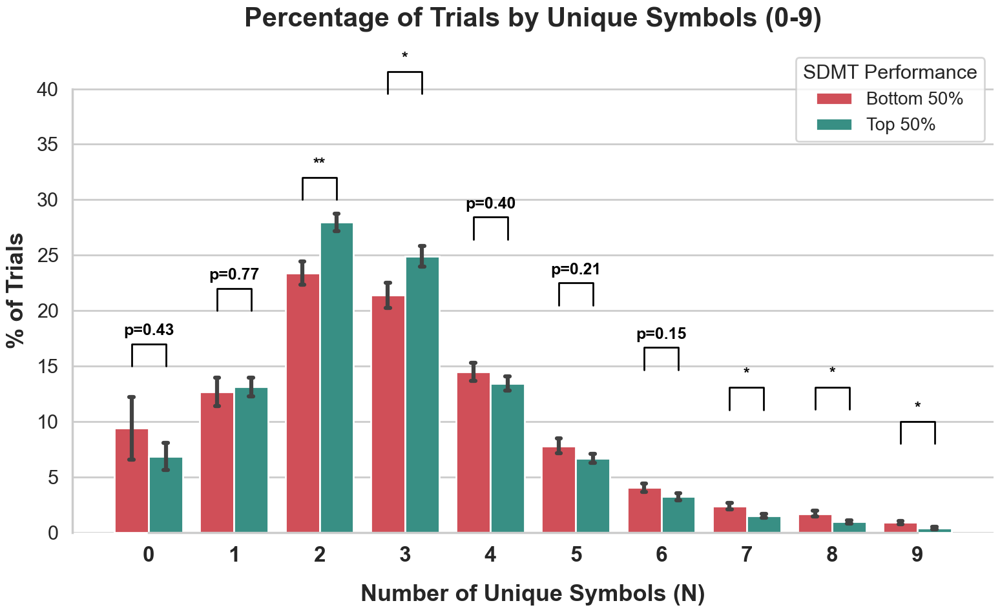

In [76]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import numpy as np

# --- 1. LOAD DATA ---
csv_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/behavioral_insights/trial_type_stats/unique_symbols_distribution.csv"
sdmt_excel_path = "/Volumes/ramot/WIS_IDO/Results/Analysis/Behavior/Final_Results_By_Date/260101/df_nontrash_behavioral_summary_20260129_091443.xlsx"

try:
    print(f"Loading behavioral data from: {csv_path}")
    df = pd.read_csv(csv_path)
    df = df[df["Measure"] == "Percentage"].copy()
    
    # --- 2. DEFINE GROUPS BY SDMT (FROM EXCEL) ---
    print(f"Loading SDMT scores from: {sdmt_excel_path}")
    df_sdmt = pd.read_excel(sdmt_excel_path)
    
    # USER UPDATE: Specific column search for Patient_ID
    possible_cols = [c for c in df_sdmt.columns if "Patient_ID" in c]
    
    if possible_cols:
        target_col = possible_cols[0]
        print(f"Found participant column: '{target_col}'")
        df_sdmt = df_sdmt.rename(columns={target_col: "Participant"})
    else:
        # Fallback if specific column not found, though user specified it exists
        print(f"Warning: 'Patient_ID' substring not found in columns: {df_sdmt.columns}")
        if "Participant" not in df_sdmt.columns:
            raise ValueError("Could not identify Participant column.")
    
    # Clean IDs
    df["Participant"] = df["Participant"].astype(str).str.strip()
    df_sdmt["Participant"] = df_sdmt["Participant"].astype(str).str.strip()

    # Drop missing SDMT scores
    sdmt_scores = df_sdmt.dropna(subset=["SDMT_Mean"]).copy()
    # Ensure one score per participant
    sdmt_scores = sdmt_scores.groupby("Participant")["SDMT_Mean"].mean().reset_index()

    # Calculate Thresholds
    lower_cutoff = sdmt_scores["SDMT_Mean"].quantile(0.50)
    upper_cutoff = sdmt_scores["SDMT_Mean"].quantile(0.50)
    
    # Identify Participants
    bottom_20_ids = sdmt_scores[sdmt_scores["SDMT_Mean"] <= lower_cutoff]["Participant"].values
    top_20_ids = sdmt_scores[sdmt_scores["SDMT_Mean"] >= upper_cutoff]["Participant"].values
    
    print(f"Bottom 50% Cutoff (SDMT): <= {lower_cutoff:.2f} (n={len(bottom_20_ids)})")
    print(f"Top 50% Cutoff (SDMT): >= {upper_cutoff:.2f} (n={len(top_20_ids)})")

    # Filter Main Data
    df_bottom = df[df["Participant"].isin(bottom_20_ids)].copy()
    df_bottom["Group"] = "Bottom 50%"
    
    df_top = df[df["Participant"].isin(top_20_ids)].copy()
    df_top["Group"] = "Top 50%"
    
    # Combine
    df_combined = pd.concat([df_bottom, df_top])
    
    # Aggregate (0-9 symbols)
    levels = list(range(10)) # [0, 1, 2, ... 9]
    
    df_part = df_combined.groupby(["Participant", "Group", "N_Unique_Symbols"])["Value"].mean().reset_index()
    df_subset = df_part[df_part["N_Unique_Symbols"].isin(levels)].copy()

except Exception as e:
    print(f"Error processing data: {e}")
    df_subset = pd.DataFrame()

# --- 3. STATS & PLOTTING ---
if not df_subset.empty:
    sns.set_context("poster", font_scale=1.0) # Slightly smaller font to fit 10 bars
    sns.set_style("whitegrid")
    
    group_low = "Bottom 50%"
    group_high = "Top 50%"
    p_values = []
    
    # A. Calculate T-Tests
    print(f"\n--- Statistics ({group_low} vs {group_high}) ---")
    for level in levels:
        vals_low = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == group_low)]["Value"].dropna()
        vals_high = df_subset[(df_subset["N_Unique_Symbols"] == level) & (df_subset["Group"] == group_high)]["Value"].dropna()
        
        if len(vals_low) > 1 and len(vals_high) > 1:
            t, p = ttest_ind(vals_low, vals_high)
            p_values.append(p)
        else:
            p_values.append(np.nan)

    # B. FDR Correction
    clean_p = [p for p in p_values if not np.isnan(p)]
    if clean_p:
        reject, corrected_p_list, _, _ = multipletests(clean_p, alpha=0.05, method='fdr_bh')
        final_p_map = {}
        idx = 0
        for i, p in enumerate(p_values):
            if not np.isnan(p):
                final_p_map[levels[i]] = corrected_p_list[idx]
                idx += 1
            else:
                final_p_map[levels[i]] = np.nan
        print(f"P-values (FDR Corrected): {final_p_map}")
    else:
        final_p_map = {l: np.nan for l in levels}

    # C. Plotting
    plt.figure(figsize=(16, 10)) # Wider figure for 0-9
    
    palette = {group_low: "#E63946", group_high: "#2A9D8F"} 
    
    ax = sns.barplot(data=df_subset, x="N_Unique_Symbols", y="Value", hue="Group",
                     order=levels,
                     hue_order=[group_low, group_high],
                     palette=palette, 
                     errorbar=('se', 1), capsize=0.1)
    
    # D. Add Significance Markers
    # Specific requests for 0, 1, 2. Dynamic fallback for others.
    manual_y_positions = {0: 15, 1: 20, 2: 30}
    bracket_h = 2

    for i, level in enumerate(levels):
        p_val = final_p_map.get(level, np.nan)
        if np.isnan(p_val): continue
        
        # Determine Y height
        if level in manual_y_positions:
            y = manual_y_positions[level]
        else:
            # Fallback for 3-9: Max data value + 5 buffer
            local_max = df_subset[df_subset["N_Unique_Symbols"] == level]["Value"].max()
            if pd.isna(local_max): local_max = 0
            y = local_max + 5

        if p_val < 0.001: sig_symbol = "***"
        elif p_val < 0.01: sig_symbol = "**"
        elif p_val < 0.05: sig_symbol = "*"
        else: sig_symbol = f"p={p_val:.2f}"
        
        x1, x2 = i - 0.2, i + 0.2
        plt.plot([x1, x1, x2, x2], [y, y + bracket_h, y + bracket_h, y], lw=2, c='k')
        plt.text(i, y + bracket_h + 0.5, sig_symbol, ha='center', va='bottom', 
                 color='k', fontsize=18, fontweight='bold')

    # E. Formatting
    plt.title("Percentage of Trials by Unique Symbols (0-9)", fontsize=30, fontweight='bold', pad=25)
    plt.xlabel("Number of Unique Symbols (N)", fontsize=26, fontweight='bold', labelpad=20)
    plt.ylabel("% of Trials", fontsize=26, fontweight='bold', labelpad=10)
    
    plt.xticks(fontsize=24, fontweight='bold')
    plt.yticks(fontsize=22)
    plt.legend(title="SDMT Performance", fontsize=20, title_fontsize=22, loc='upper right')
    
    sns.despine(trim=True)
    plt.tight_layout()
    plt.show()

else:
    print("No data found or merge failed.")

## PLOTing default comparing to memory strategies by group

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def get_euclidean_distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

results = []

for p in participants:
    for panel, tm in p.trial_managers.items():
        for i, trial in enumerate(tm.trials):
            # print(f"Processing {p.name} - {panel} Trial {i + 1}, trigger: {trial.triggering_symbol}, searches: {len(trial.searches) if hasattr(trial, 'searches') else 'N/A'}")

            
            if not trial.searches or len(trial.searches) == 0:
                dist_center = 0
            
            elif trial.searches[0].sequence is None or len(trial.searches[0].sequence) == 0:
                continue
            else:
                fixation_objects = list(trial.searches[0].sequence.items())
                if fixation_objects[0][0] is None:
                    #then next symbol is the first fixation
                    first_fix = fixation_objects[1][0]
                    first_fix_symbol= fixation_objects[1][1]    
                else:
                    first_fix = fixation_objects[0][0]
                    first_fix_symbol= fixation_objects[0][1]

            # 3. Distance to Target
            target_roi = tm.rois[trial.triggering_symbol.value - 1] 
            print(f"First fixation was on symbol {first_fix_symbol.value if first_fix_symbol is not None else 'None'}, Target ROI: {target_roi.idx}")
            first_fix_coords = first_fix.position
            dist_target = get_euclidean_distance(first_fix_coords, target_roi.center)
            
            # 4. Distance to Symbol 5 (Center)
            symbol_5_roi = tm.rois[4]
            print(f"Symbol 5 ROI: {symbol_5_roi.idx}, Center: {symbol_5_roi.center}")
            dist_center = get_euclidean_distance(first_fix_coords, symbol_5_roi.center)
            
            results.append({
                'Participant': p.name,
                'Group': p.group,
                'Panel': panel,
                'Trial': i + 1,
                'DistTarget': dist_target,
                'DistCenter': dist_center
            })

df_plot = pd.DataFrame(results)

#save the csv
output_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df_plot.to_csv(output_path, index=False)
print(f"Data saved to {output_path}")

First fixation was on symbol 3, Target ROI: 3
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 5, Target ROI: 8
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 6, Target ROI: 2
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 3, Target ROI: 7
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 6, Target ROI: 8
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 5, Target ROI: 4
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 6, Target ROI: 3
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 4, Target ROI: 0
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 2, Target ROI: 5
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 1, Target ROI: 2
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 1, Target ROI: 8
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol 4, Target ROI: 3
Symbol 5 ROI: 4, Center: (472, 41)
First fixation was on symbol

In [86]:
#read the csv
output_path= "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances.csv"
df_plot = pd.read_csv(output_path)


In [62]:
def plot_evolution(df, metric, title, ylabel):
    panels = sorted(df['Panel'].unique())
    fig, axes = plt.subplots(1, len(panels), figsize=(20, 5), sharey=True)
    
    for i, panel in enumerate(panels):
        sns.lineplot(
            data=df[df['Panel'] == panel],
            x='Trial', y=metric, hue='Group',
            ax=axes[i], marker='o', err_style='band', ci=68 # 68% CI = SEM
        )
        axes[i].set_title(f'Panel {panel}')
        axes[i].set_xlabel('Trial Number')
        if i == 0:
            axes[i].set_ylabel(ylabel)
        else:
            axes[i].set_ylabel('')
            
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn

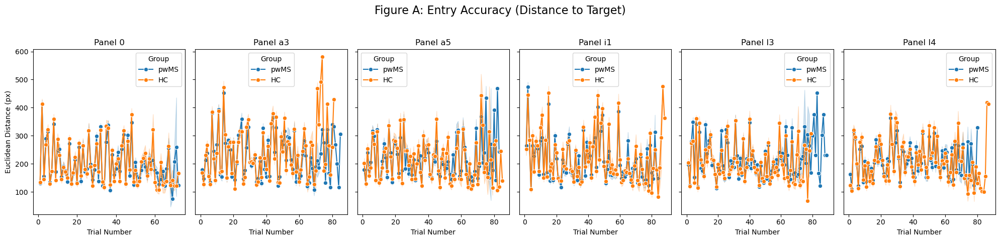

In [63]:
# Generate Figure A
plot_evolution(df_plot, 'DistTarget', 'Figure A: Entry Accuracy (Distance to Target)', 'Euclidean Distance (px)')


/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/40620201.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.lineplot(
/var/folders/hm/x0ywtq191fg1bn

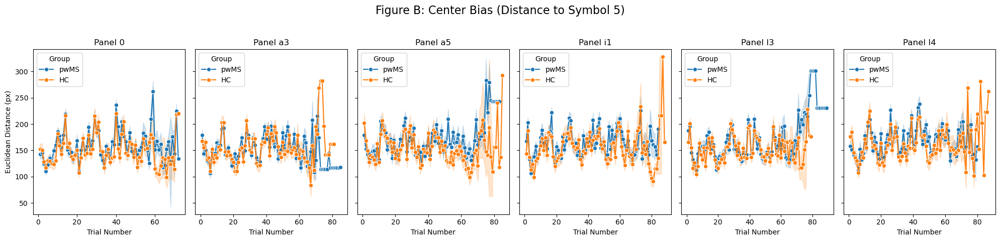

In [64]:
# Generate Figure B
plot_evolution(df_plot, 'DistCenter', 'Figure B: Center Bias (Distance to Symbol 5)', 'Euclidean Distance (px)')

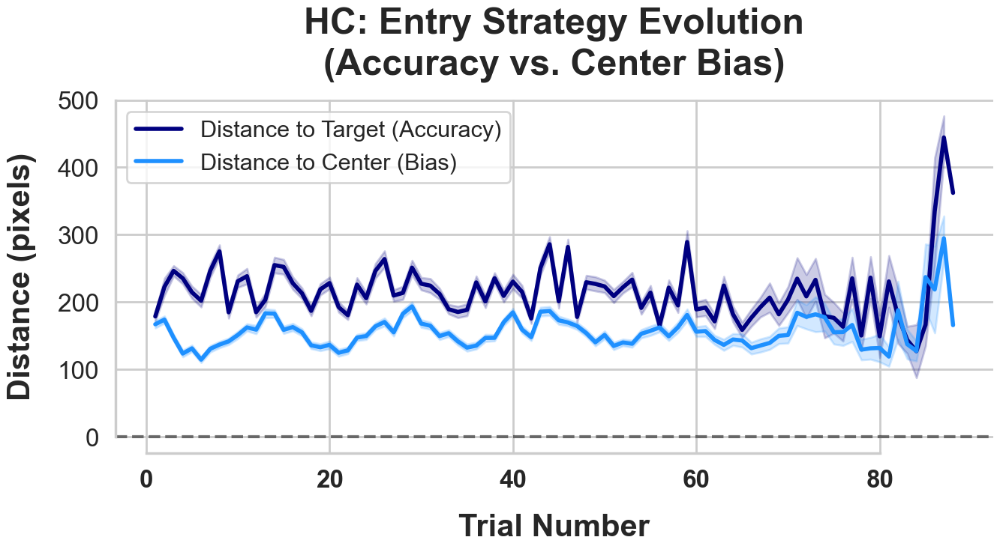

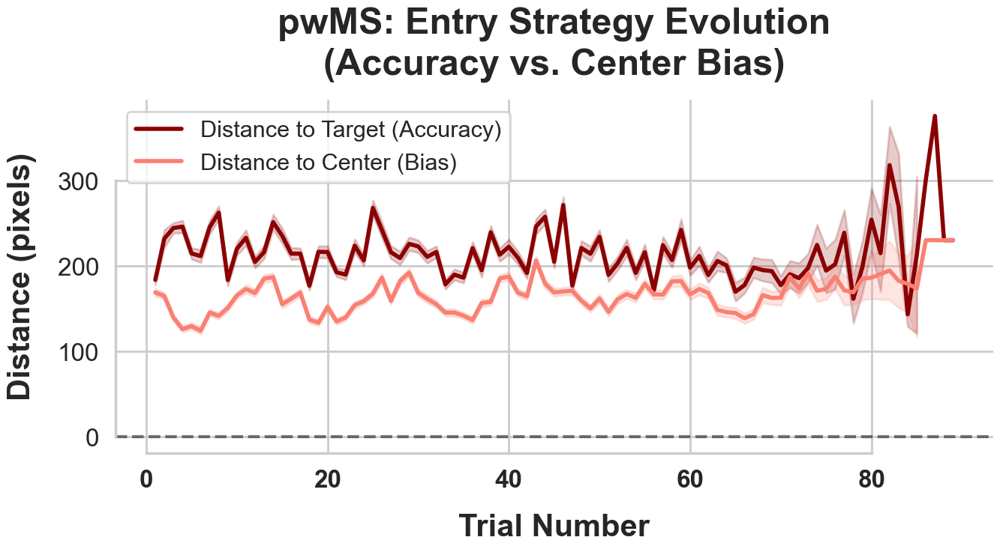

In [77]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. PREPARE DATA ---
# FIX: Use the exact column names from your extraction code: 'Trial', 'DistTarget', 'DistCenter'
df_long = df_plot.melt(id_vars=["Participant", "Group", "Trial", "Panel"], 
                       value_vars=["DistTarget", "DistCenter"],
                       var_name="Metric", value_name="Distance_px")

# Rename for cleaner legend
df_long["Metric"] = df_long["Metric"].replace({
    "DistTarget": "Distance to Target (Accuracy)",
    "DistCenter": "Distance to Center (Bias)"
})

# --- 2. PLOTTING FUNCTION ---
def plot_group_comparison(group_name, color_palette):
    # Filter for the specific group
    subset = df_long[df_long["Group"] == group_name]
    
    if subset.empty:
        print(f"No data for {group_name}")
        return

    # Poster Settings
    sns.set_context("poster", font_scale=1.2)
    sns.set_style("whitegrid")
    
    plt.figure(figsize=(14, 8))
    
    # Line Plot: Compare the two metrics for this group
    # FIX: x="Trial" (not Trial_Index)
    sns.lineplot(data=subset, x="Trial", y="Distance_px", hue="Metric",
                 palette=color_palette, linewidth=4, errorbar='se')
    
    # Titles & Labels
    plt.title(f"{group_name}: Entry Strategy Evolution\n(Accuracy vs. Center Bias)", 
              fontsize=35, fontweight='bold', pad=25)
    plt.xlabel("Trial Number", fontsize=30, fontweight='bold', labelpad=20)
    plt.ylabel("Distance (pixels)", fontsize=30, fontweight='bold', labelpad=20)
    
    # Ticks & Legend
    plt.xticks(fontsize=24, fontweight='bold')
    plt.yticks(fontsize=24)
    plt.legend(title="", fontsize=22, loc='best') # Empty title for cleaner look
    
    # Add Zero Line (Target/Center perfect hit)
    plt.axhline(0, color='black', linestyle='--', alpha=0.5)
    
    sns.despine(trim=True)
    plt.tight_layout()
    plt.show()

# --- 3. GENERATE THE PLOTS ---

# Plot A: Healthy Controls (HC)
plot_group_comparison("HC", {"Distance to Target (Accuracy)": "navy", 
                             "Distance to Center (Bias)": "dodgerblue"})

# Plot B: MS Patients (pwMS/MS)
target_group = "MS" if "MS" in df_plot["Group"].unique() else "pwMS"

plot_group_comparison(target_group, {"Distance to Target (Accuracy)": "darkred", 
                                     "Distance to Center (Bias)": "salmon"})

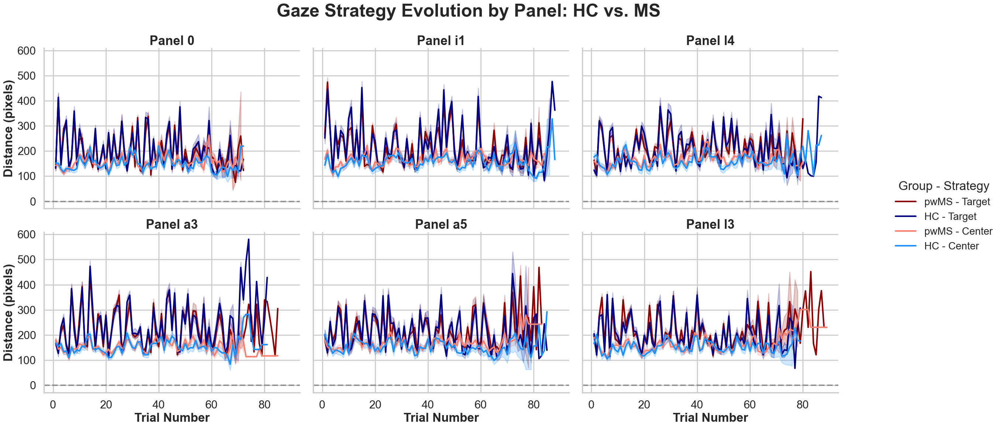

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. PREPARE DATA ---
# We use the 'df_plot' from your extraction code
# Melt to get a single 'Distance' column, but keep 'Group' and 'Panel'
df_long = df_plot.melt(id_vars=["Participant", "Group", "Trial", "Panel"], 
                       value_vars=["DistTarget", "DistCenter"],
                       var_name="Metric_Type", value_name="Distance_px")

# Create a combined column for hue: "Group - Metric"
# This gives us 4 unique categories for the legend
df_long["Condition"] = df_long["Group"] + " - " + df_long["Metric_Type"].replace({
    "DistTarget": "Target",
    "DistCenter": "Center"
})

# --- 2. DEFINE COLORS ---
# We need 4 clear colors. 
# HC = Blue shades (Dark=Target, Light=Center)
# MS = Red shades (Dark=Target, Light=Center)
custom_palette = {
    "HC - Target": "navy",       # HC Accuracy
    "HC - Center": "dodgerblue", # HC Bias
    "MS - Target": "darkred",    # MS Accuracy (Ensure your data says "MS" or "pwMS")
    "MS - Center": "salmon",     # MS Bias
    "pwMS - Target": "darkred",  # Fallback if group is pwMS
    "pwMS - Center": "salmon"
}

# --- 3. PLOTTING ---
# Poster Settings
sns.set_context("poster", font_scale=1.0)
sns.set_style("whitegrid")

# Create a FacetGrid: One subplot per Panel
g = sns.FacetGrid(df_long, col="Panel", col_wrap=3, height=6, aspect=1.3,
                  sharex=True, sharey=True)

# Map the lineplot
g.map_dataframe(sns.lineplot, x="Trial", y="Distance_px", hue="Condition",
                palette=custom_palette, linewidth=3, errorbar='se')

# --- 4. FORMATTING ---
# Titles
g.set_titles("Panel {col_name}", fontweight='bold', size=25)
g.set_axis_labels("Trial Number", "Distance (pixels)", fontweight='bold')

# Main Title
g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Gaze Strategy Evolution by Panel: HC vs. MS", fontsize=35, fontweight='bold')

# Legend
# We manually handle the legend to ensure it looks clean
g.add_legend(title="Group - Strategy", fontsize=20, title_fontsize=22, loc='center right', bbox_to_anchor=(1.05, 0.5))

# Add Zero Line
for ax in g.axes.flat:
    ax.axhline(0, color='black', linestyle='--', alpha=0.3)

plt.show()

Running Split-Half Iterations: 100%|██████████| 1000/1000 [00:07<00:00, 132.15it/s]


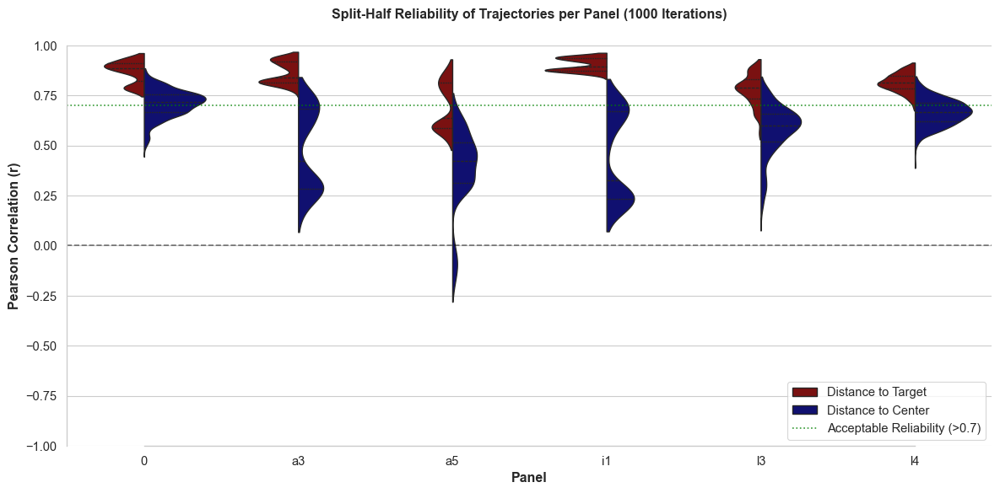

In [152]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from tqdm import tqdm # Optional, for progress bar

def compute_split_half_reliability(df, iterations=1000):
    unique_participants = df['Participant'].unique()
    results = []

    for i in tqdm(range(iterations), desc="Running Split-Half Iterations"):
        np.random.shuffle(unique_participants)
        half1_subs = unique_participants[:len(unique_participants)//2]
        half2_subs = unique_participants[len(unique_participants)//2:]
        
        # Calculate mean trajectory per panel and trial for each half
        h1_means = df[df['Participant'].isin(half1_subs)].groupby(['Panel', 'Trial'])[['DistTarget', 'DistCenter']].mean().reset_index()
        h2_means = df[df['Participant'].isin(half2_subs)].groupby(['Panel', 'Trial'])[['DistTarget', 'DistCenter']].mean().reset_index()
        
        # Merge halves to align trials perfectly
        merged = pd.merge(h1_means, h2_means, on=['Panel', 'Trial'], suffixes=('_H1', '_H2'))
        
        # Calculate correlation per panel
        for panel in merged['Panel'].unique():
            panel_data = merged[merged['Panel'] == panel]
            
            # Require at least 3 trials to compute a valid correlation
            if len(panel_data) > 2:
                r_target, _ = pearsonr(panel_data['DistTarget_H1'], panel_data['DistTarget_H2'])
                r_center, _ = pearsonr(panel_data['DistCenter_H1'], panel_data['DistCenter_H2'])
                
                results.append({'Panel': panel, 'Metric': 'Distance to Target', 'r': r_target})
                results.append({'Panel': panel, 'Metric': 'Distance to Center', 'r': r_center})

    return pd.DataFrame(results)

# 1. Compute correlations
# Note: Ensure your df_plot has 'Participant', 'Panel', 'Trial', 'DistTarget', 'DistCenter'
df_reliability = compute_split_half_reliability(df_plot, iterations=1000)

# 2. Visualization
sns.set_context("paper", font_scale=1.2)
sns.set_style("whitegrid")

plt.figure(figsize=(12, 6))

# Split-violin plot effectively shows the distribution shape for both metrics per panel
sns.violinplot(
    data=df_reliability, 
    x="Panel", 
    y="r", 
    hue="Metric", 
    split=True, 
    inner="quartile",
    palette={"Distance to Target": "darkred", "Distance to Center": "navy"},
    cut=0
)

plt.title("Split-Half Reliability of Trajectories per Panel (1000 Iterations)", fontweight='bold')
plt.xlabel("Panel", fontweight='bold')
plt.ylabel("Pearson Correlation (r)", fontweight='bold')
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.axhline(0.7, color='green', linestyle=':', alpha=0.8, label='Acceptable Reliability (>0.7)')
plt.ylim(-1, 1.1)

# Fix legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2] + [handles[-1]], labels[:2] + [labels[-1]], loc='lower right')

sns.despine(trim=True)
plt.tight_layout()
plt.show()

Running Global Split-Half: 100%|██████████| 1000/1000 [00:03<00:00, 252.70it/s]
/var/folders/hm/x0ywtq191fg1bn25skwntmw80000gn/T/ipykernel_4089/3252001079.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


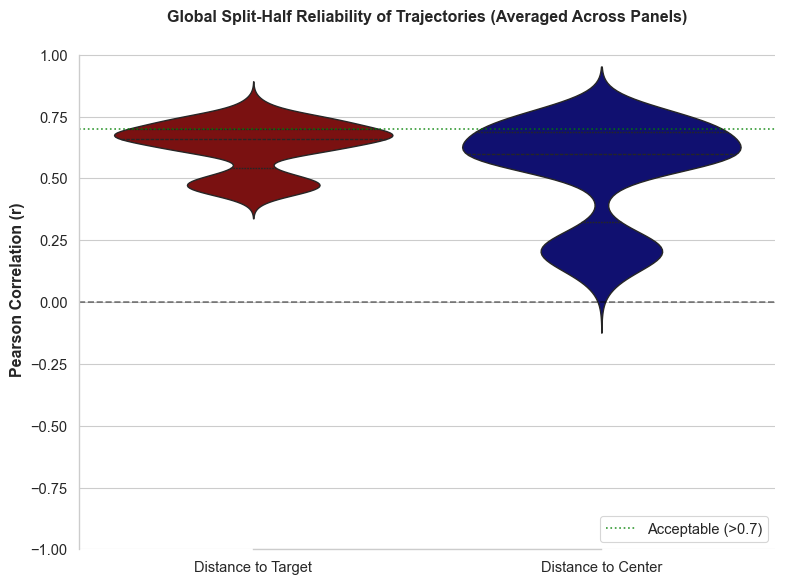

In [153]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from tqdm import tqdm

def compute_global_split_half(df, iterations=1000):
    # Ensure Trial dimension exists. If using df_participant_avg without Trials, this will fail.
    if 'Trial' not in df.columns:
        raise ValueError("Data must contain a 'Trial' column to compute trajectory correlation.")

    unique_participants = df['Participant'].unique()
    results = []

    for _ in tqdm(range(iterations), desc="Running Global Split-Half"):
        np.random.shuffle(unique_participants)
        half1_subs = unique_participants[:len(unique_participants)//2]
        half2_subs = unique_participants[len(unique_participants)//2:]
        
        # Aggregate across all panels, keeping only the Trial vector
        h1_means = df[df['Participant'].isin(half1_subs)].groupby('Trial')[['DistTarget', 'DistCenter']].mean().reset_index()
        h2_means = df[df['Participant'].isin(half2_subs)].groupby('Trial')[['DistTarget', 'DistCenter']].mean().reset_index()
        
        merged = pd.merge(h1_means, h2_means, on='Trial', suffixes=('_H1', '_H2'))
        
        if len(merged) > 2:
            r_target, _ = pearsonr(merged['DistTarget_H1'], merged['DistTarget_H2'])
            r_center, _ = pearsonr(merged['DistCenter_H1'], merged['DistCenter_H2'])
            
            results.append({'Metric': 'Distance to Target', 'r': r_target})
            results.append({'Metric': 'Distance to Center', 'r': r_center})

    return pd.DataFrame(results)

# 1. Compute correlations (use df_plot directly to safely average across panels while keeping Trials)
df_global_rel = compute_global_split_half(df_plot, iterations=1000)

# 2. Visualization
sns.set_context("paper", font_scale=1.2)
sns.set_style("whitegrid")

plt.figure(figsize=(8, 6))

sns.violinplot(
    data=df_global_rel, 
    x="Metric", 
    y="r", 
    palette={"Distance to Target": "darkred", "Distance to Center": "navy"},
    inner="quartile"
)

plt.title("Global Split-Half Reliability of Trajectories (Averaged Across Panels)", fontweight='bold')
plt.ylabel("Pearson Correlation (r)", fontweight='bold')
plt.xlabel("")
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.axhline(0.7, color='green', linestyle=':', alpha=0.8, label='Acceptable (>0.7)')
plt.ylim(-1, 1.1)
plt.legend(loc='lower right')

sns.despine(trim=True)
plt.tight_layout()
plt.show()

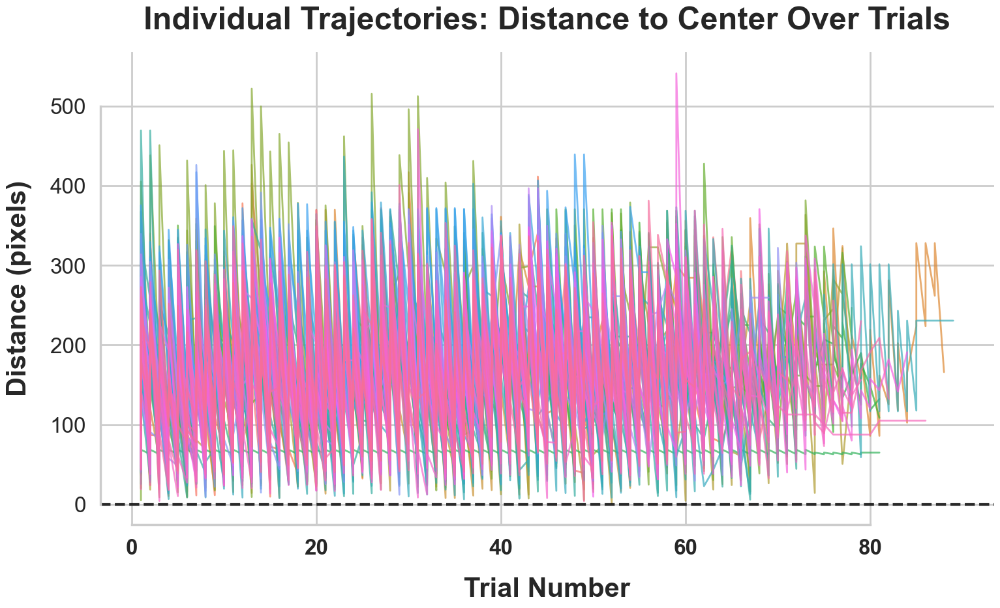

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

output_path= "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances.csv"
df_plot = pd.read_csv(output_path)

# --- PLOTTING ---
sns.set_style("whitegrid")
plt.figure(figsize=(16, 10))

# Plot individual trajectories, mapped to Participant for distinct colors
# estimator=None prevents averaging, drawing the raw lines
sns.lineplot(
    data=df_plot, 
    x="Trial", 
    y="DistCenter", 
    hue="Participant",      # Unique color per participant
    units="Participant",    # Group the data points into individual lines
    estimator=None,         # Do not aggregate
    palette="husl",         # Generates evenly spaced colors in color space
    linewidth=2,
    alpha=0.7,
    legend=False            # Disabled to prevent a massive, unreadable legend box
)

# --- FORMATTING ---
plt.title("Individual Trajectories: Distance to Center Over Trials", 
          fontsize=35, fontweight='bold', pad=25)
plt.xlabel("Trial Number", fontsize=30, fontweight='bold', labelpad=20)
plt.ylabel("Distance (pixels)", fontsize=30, fontweight='bold', labelpad=20)

plt.xticks(fontsize=24, fontweight='bold')
plt.yticks(fontsize=24)

# Add Reference Line (0 = Perfect Center)
plt.axhline(0, color='black', linestyle='--', alpha=0.8, linewidth=3)

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [156]:
df_plot.shape

(26663, 13)

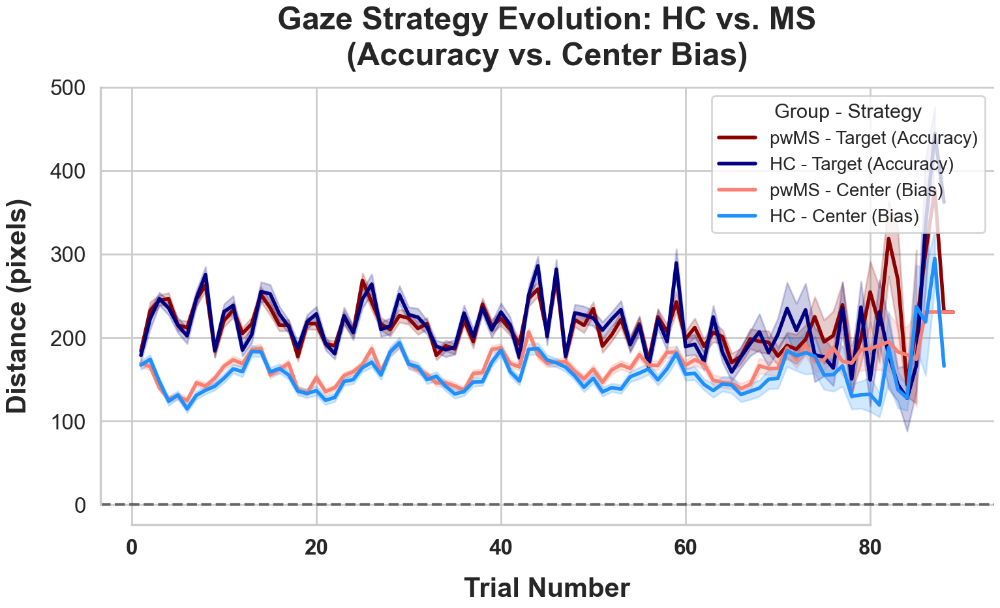

In [79]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. PREPARE DATA ---
# Melt the data to long format
df_long = df_plot.melt(id_vars=["Participant", "Group", "Trial", "Panel"], 
                       value_vars=["DistTarget", "DistCenter"],
                       var_name="Metric", value_name="Distance_px")

# Rename metrics for clarity
df_long["Metric"] = df_long["Metric"].replace({
    "DistTarget": "Target (Accuracy)",
    "DistCenter": "Center (Bias)"
})

# Create a composite 'Condition' column to distinguish all 4 lines
# Example values: "HC - Target (Accuracy)", "MS - Center (Bias)"
df_long["Condition"] = df_long["Group"] + " - " + df_long["Metric"]

# --- 2. PLOTTING ---
# Define the 4 colors manually to ensure consistency
custom_palette = {
    "HC - Target (Accuracy)": "navy",       # HC Accuracy (Dark Blue)
    "HC - Center (Bias)": "dodgerblue",     # HC Bias (Light Blue)
    "MS - Target (Accuracy)": "darkred",    # MS Accuracy (Dark Red)
    "MS - Center (Bias)": "salmon",         # MS Bias (Light Red)
    "pwMS - Target (Accuracy)": "darkred",  # Fallback
    "pwMS - Center (Bias)": "salmon"
}

# Poster Settings
sns.set_context("poster", font_scale=1.2)
sns.set_style("whitegrid")

plt.figure(figsize=(16, 10))

# Plot all 4 lines at once
sns.lineplot(data=df_long, x="Trial", y="Distance_px", hue="Condition",
             palette=custom_palette, linewidth=4, errorbar='se')

# --- 3. FORMATTING ---
plt.title("Gaze Strategy Evolution: HC vs. MS\n(Accuracy vs. Center Bias)", 
          fontsize=35, fontweight='bold', pad=25)
plt.xlabel("Trial Number", fontsize=30, fontweight='bold', labelpad=20)
plt.ylabel("Distance (pixels)", fontsize=30, fontweight='bold', labelpad=20)

# Ticks
plt.xticks(fontsize=24, fontweight='bold')
plt.yticks(fontsize=24)

# Legend
plt.legend(title="Group - Strategy", fontsize=20, title_fontsize=22, loc='upper right')

# Add Reference Line (0 = Perfect Accuracy/Center)
plt.axhline(0, color='black', linestyle='--', alpha=0.5)

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [90]:
df_sdmt.head()


,Patient_ID,Trash!,Full,Why_Not_Full,Tobii_Sucks,Group,SOC,IN_7TMS,IN_SOC,IS_SOC_ONLY,...,Stroop_RT_I_All,Stroop_RT_X_Correct,Stroop_RT_C_Correct,Stroop_RT_I_Correct,Stroop_Interference_RT_Correct,Stroop_Interference_RT_All,Stroop_Interference_Acc,MW_Typ_Grand_vsallmw,MW_Typ_Social_vsallmw,MW_Typ_Object_vsallmw
0,AA562,NO,v,NaN,NO,MS,0,1,0,0,...,2.552,2.428,2.365,2.552,0.187,0.187,0.00,93.374134,92.585031,94.163238
1,AG562,NO,v,NaN,NO,MS,0,1,0,0,...,2.098,2.007,2.041,2.098,0.057,0.063,-8.33,123.696919,114.218838,133.368429
2,AL371,NO,v,NaN,NO,MS,0,1,0,0,...,2.593,2.495,2.479,2.593,0.114,0.114,0.00,90.269423,93.046405,87.492441
3,AN814,NO,NaN,NaN,NO,HC,0,1,0,0,...,2.568,2.348,2.322,2.568,0.246,0.249,-4.17,108.157718,103.992563,112.669969
4,AP344,NO,NaN,No_MRI,NO,MS,0,1,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,116.075056,110.898943,121.147647


In [103]:
# Initialize the column to prevent fragmentation warnings if it doesn't exist
if "SDMT_Score" not in df_plot.columns:
    df_plot["SDMT_Score"] = pd.NA 

for participant in participants:
    for panel, score in participant.scores.items():
        if participant.name == "AG562":
            print(f"AG562 - Panel: {panel}, Score: {score}")
        
        # Create a strict mask matching BOTH Participant AND Panel
        mask = (df_plot["Participant"] == participant.name) & (df_plot["Panel"] == panel)
        
        # Safely assign the score using .loc
        df_plot.loc[mask, "SDMT_Score"] = score


#save the new csv
output_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances_with_sdmt.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df_plot.to_csv(output_path, index=False)
print(f"Data with SDMT scores saved to {output_path}")

AG562 - Panel: 0, Score: 67.0
AG562 - Panel: i1, Score: 73.0
AG562 - Panel: l4, Score: 77.0
AG562 - Panel: a3, Score: 74.0
AG562 - Panel: a5, Score: 76.0
AG562 - Panel: l3, Score: 68.0
Data with SDMT scores saved to /Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances_with_sdmt.csv


In [104]:
df_plot[df_plot["Participant"]=="AG562"].head()


,Participant,Group,Panel,Trial,DistTarget,DistCenter,SDMT_Score
19406,AG562,pwMS,0,1,72.794227,139.779106,67.0
19407,AG562,pwMS,0,2,416.263802,109.447022,67.0
19408,AG562,pwMS,0,3,200.476987,58.864463,67.0
19409,AG562,pwMS,0,4,243.698346,47.431536,67.0
19410,AG562,pwMS,0,5,333.030401,35.461660,67.0


In [105]:
#read from the new csv
output_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/over_time_learning/first_fixation_distances_with_sdmt.csv"
df_plot = pd.read_csv(output_path)

#average the distance over trials for each participant per panel
df_avg = df_plot.groupby(["Participant", "Group", "Panel", "SDMT_Score"])[["DistTarget", "DistCenter"]].mean().reset_index()    
df_avg.head()


,Participant,Group,Panel,SDMT_Score,DistTarget,DistCenter
0,AG562,pwMS,0,67.0,179.295841,129.872861
1,AG562,pwMS,a3,74.0,220.834394,167.239280
2,AG562,pwMS,a5,76.0,206.224270,158.059221
3,AG562,pwMS,i1,73.0,200.081003,146.071600
4,AG562,pwMS,l3,68.0,198.706591,158.224073


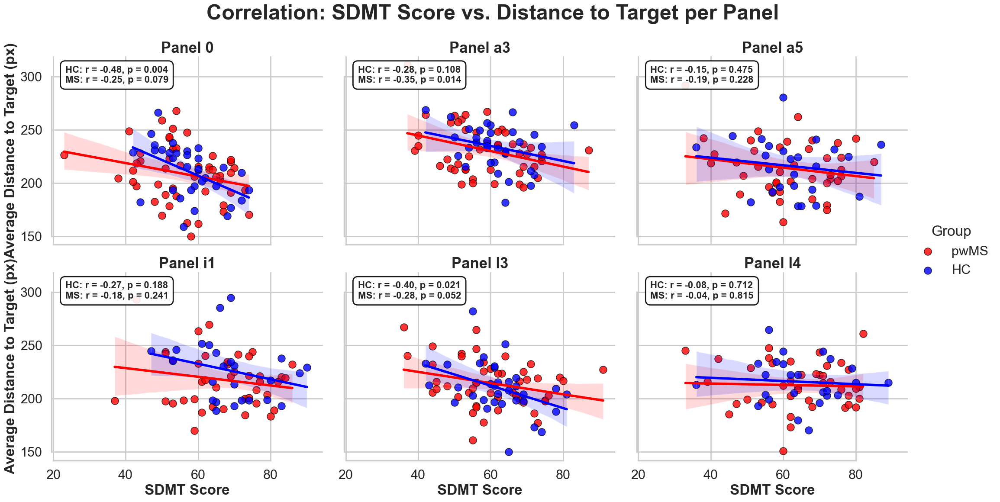

In [109]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# --- POSTER STYLE ---
sns.set_context("poster", font_scale=1.0)
sns.set_style("whitegrid")

# --- PLOTTING ---
g = sns.lmplot(
    data=df_avg, 
    x="SDMT_Score", 
    y="DistTarget", 
    hue="Group",
    col="Panel",
    col_wrap=3,
    height=6, 
    aspect=1.2,
    palette={"HC": "blue", "pwMS": "red", "MS": "red"}, 
    scatter_kws={"s": 150, "alpha": 0.8, "edgecolor": "k"},
    line_kws={"linewidth": 4}
)

# --- FORMATTING ---
g.set_titles("Panel {col_name}", fontweight='bold', size=25)
g.set_axis_labels("SDMT Score", "Average Distance to Target (px)", fontweight='bold')

g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Correlation: SDMT Score vs. Distance to Target per Panel", 
               fontsize=35, fontweight='bold')

# --- STATISTICAL ANNOTATION (PER GROUP) ---
# We calculate r and p for HC and MS separately to match the plotted regression lines.
for panel, ax in g.axes_dict.items():
    subset = df_avg[df_avg["Panel"] == panel]
    
    stats_lines = []
    
    # HC Stats
    hc_data = subset[subset["Group"] == "HC"].dropna(subset=["SDMT_Score", "DistTarget"])
    if len(hc_data) > 2:
        r_hc, p_hc = pearsonr(hc_data["SDMT_Score"], hc_data["DistTarget"])
        stats_lines.append(f"HC: r = {r_hc:.2f}, p = {p_hc:.3f}")
        
    # MS Stats
    ms_data = subset[subset["Group"].isin(["MS", "pwMS"])].dropna(subset=["SDMT_Score", "DistTarget"])
    if len(ms_data) > 2:
        r_ms, p_ms = pearsonr(ms_data["SDMT_Score"], ms_data["DistTarget"])
        stats_lines.append(f"MS: r = {r_ms:.2f}, p = {p_ms:.3f}")
        
    # Add text box to the plot
    if stats_lines:
        stats_text = "\n".join(stats_lines)
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                horizontalalignment='left', verticalalignment='top', 
                fontsize=16, fontweight='bold',
                bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=0.5'))

sns.despine(trim=True)
plt.show()

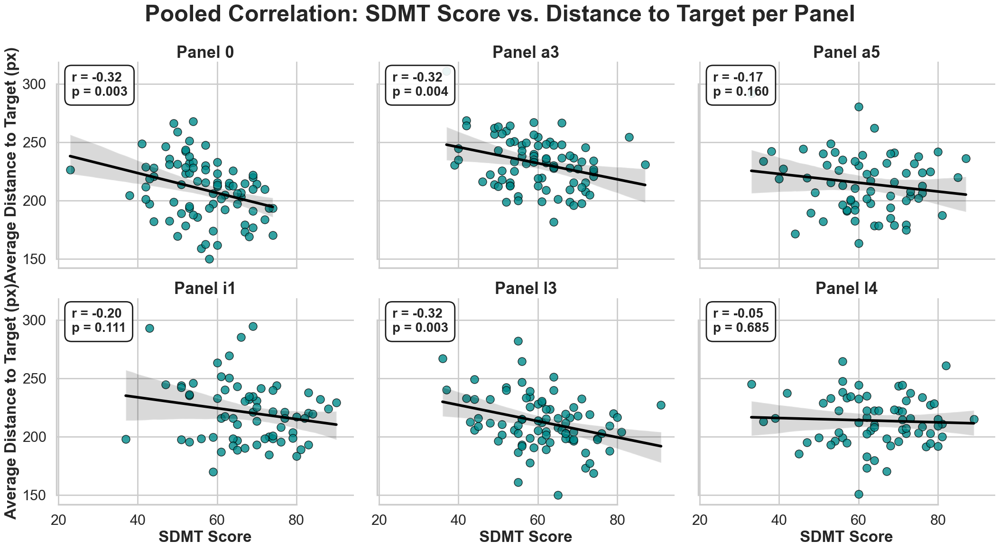

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# --- POSTER STYLE ---
sns.set_context("poster", font_scale=1.0)
sns.set_style("whitegrid")

# --- PLOTTING ---
# Removed 'hue' to pool all participants together
g = sns.lmplot(
    data=df_avg, 
    x="SDMT_Score", 
    y="DistTarget", 
    col="Panel",
    col_wrap=3,
    height=6, 
    aspect=1.2,
    scatter_kws={"s": 150, "alpha": 0.8, "edgecolor": "k", "color": "darkcyan"},
    line_kws={"linewidth": 4, "color": "black"}
)

# --- FORMATTING ---
g.set_titles("Panel {col_name}", fontweight='bold', size=25)
g.set_axis_labels("SDMT Score", "Average Distance to Target (px)", fontweight='bold')

g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Pooled Correlation: SDMT Score vs. Distance to Target per Panel", 
               fontsize=35, fontweight='bold')

# --- STATISTICAL ANNOTATION (POOLED) ---
for panel, ax in g.axes_dict.items():
    # Drop NaNs for the specific columns we are correlating
    subset = df_avg[df_avg["Panel"] == panel].dropna(subset=["SDMT_Score", "DistTarget"])
    
    if len(subset) > 2:
        r, p = pearsonr(subset["SDMT_Score"], subset["DistTarget"])
        stats_text = f"r = {r:.2f}\np = {p:.3f}"
        
        # Add text box to the plot
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                horizontalalignment='left', verticalalignment='top', 
                fontsize=20, fontweight='bold',
                bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=0.5'))

sns.despine(trim=True)
plt.show()

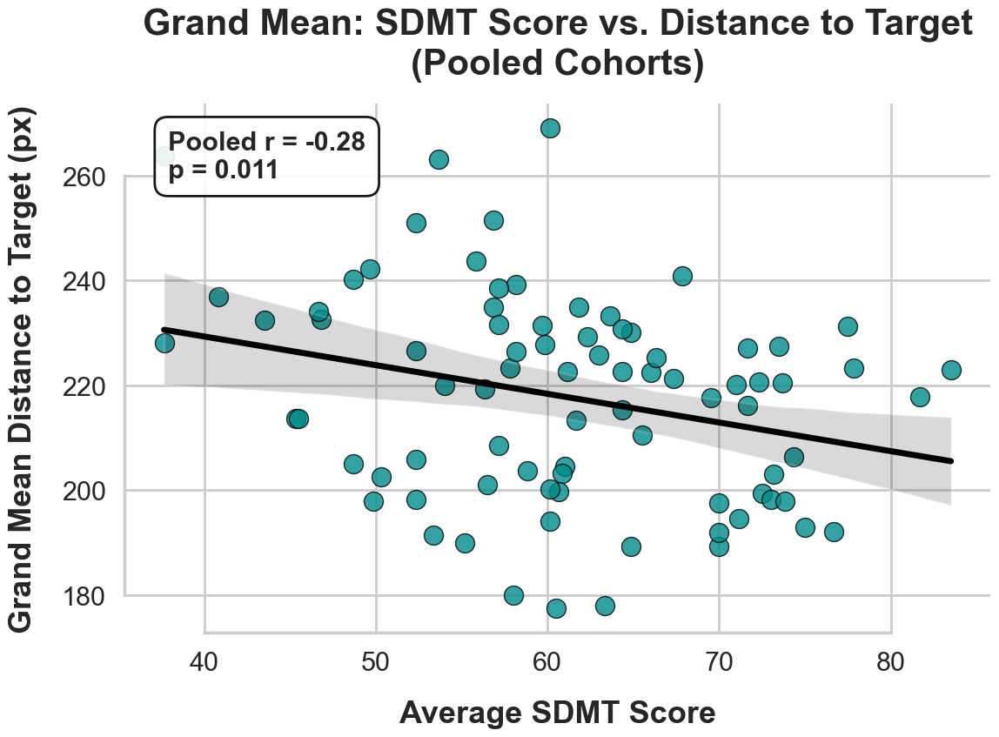

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# --- 1. AGGREGATE DATA ACROSS PANELS ---
# Group by Participant (and Group, to retain the label just in case) and calculate the mean
df_global = df_avg.groupby(['Participant', 'Group']).agg({
    'SDMT_Score': 'mean', 
    'DistTarget': 'mean'
}).reset_index()

# Drop missing values to prevent Pearson calculation errors
df_global_clean = df_global.dropna(subset=['SDMT_Score', 'DistTarget'])

# --- 2. STATISTICAL CALCULATION ---
if len(df_global_clean) > 2:
    r, p = pearsonr(df_global_clean["SDMT_Score"], df_global_clean["DistTarget"])
else:
    r, p = float('nan'), float('nan')
    print("Not enough valid data points to calculate correlation.")

# --- 3. PLOTTING ---
sns.set_context("poster", font_scale=1.0)
sns.set_style("whitegrid")

plt.figure(figsize=(12, 9))

# Plot the pooled regression
ax = sns.regplot(
    data=df_global_clean, 
    x="SDMT_Score", 
    y="DistTarget",
    scatter_kws={"s": 250, "alpha": 0.8, "edgecolor": "k", "color": "darkcyan"},
    line_kws={"linewidth": 5, "color": "black"}
)

# --- 4. FORMATTING & ANNOTATION ---
plt.title("Grand Mean: SDMT Score vs. Distance to Target\n(Pooled Cohorts)", 
          fontsize=30, fontweight='bold', pad=25)
plt.xlabel("Average SDMT Score", fontsize=26, fontweight='bold', labelpad=20)
plt.ylabel("Grand Mean Distance to Target (px)", fontsize=26, fontweight='bold', labelpad=20)

# Add the text box with the pooled stats
stats_text = f"Pooled r = {r:.2f}\np = {p:.3f}"
ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
        verticalalignment='top', horizontalalignment='left',
        fontsize=22, fontweight='bold',
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', boxstyle='round,pad=0.5'))

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [115]:
import numpy as np

# Initialize the new column
if "N_Symbols_Search" not in df_plot.columns:
    df_plot["N_Symbols_Search"] = np.nan

for p in participants:
    for panel, tm in p.trial_managers.items():
        for i, trial in enumerate(tm.trials):
            n_symbols = 0 
            
            # Validate search and sequence existence
            if hasattr(trial, 'searches') and trial.searches and len(trial.searches) > 0:
                first_search = trial.searches[0]
                if hasattr(first_search, 'sequence') and first_search.sequence:
                    # Count valid symbols in the sequence (ignoring None)
                    n_symbols = sum(1 for fix, sym in first_search.sequence.items() if sym is not None)
            
            # Match Participant, Panel, and Trial (Trial was saved as i + 1)
            mask = (df_plot["Participant"] == p.name) & \
                   (df_plot["Panel"] == panel) & \
                   (df_plot["Trial"] == (i + 1))
            
            df_plot.loc[mask, "N_Symbols_Search"] = n_symbols

print("Added 'N_Symbols_Search' to df_plot.")

Added 'N_Symbols_Search' to df_plot.


In [118]:
# Initialize the new columns
if "Time_in_Searches" not in df_plot.columns:
    df_plot["Time_in_Searches"] = np.nan
if "Inter_Trial_Interval" not in df_plot.columns:
    df_plot["Inter_Trial_Interval"] = np.nan

for p in participants:
    for panel, tm in p.trial_managers.items():
        for i, trial in enumerate(tm.trials):
            
            # --- 1. Calculate Time in Searches ---
            total_search_time = 0
            if hasattr(trial, 'searches') and trial.searches:
                for search in trial.searches:
                    # Use duration if it exists, otherwise calculate from start/end
                    if hasattr(search, 'duration') and search.duration is not None:
                        total_search_time += search.duration()
                    elif hasattr(search, 'start_time') and hasattr(search, 'end_time'):
                        total_search_time += (search.end_time - search.start_time)
            
            # --- 2. Calculate Inter-Trial Interval (ITI) ---
            iti = np.nan
            if i > 0:
                prev_trial = tm.trials[i-1]
                # Verify both trials have the necessary timestamp attributes
                if hasattr(trial, 'start_time') and hasattr(prev_trial, 'end_time'):
                    iti = trial.start_time - prev_trial.end_time

            # --- 3. Update DataFrame ---
            mask = (df_plot["Participant"] == p.name) & \
                   (df_plot["Panel"] == panel) & \
                   (df_plot["Trial"] == (i + 1))
            
            df_plot.loc[mask, "Time_in_Searches"] = total_search_time
            df_plot.loc[mask, "Inter_Trial_Interval"] = iti

print("Added 'Time_in_Searches' and 'Inter_Trial_Interval' to df_plot.")

Added 'Time_in_Searches' and 'Inter_Trial_Interval' to df_plot.


In [120]:

# Initialize the new columns
if "Avg_Distance_to_ROI" not in df_plot.columns:
    df_plot["Avg_Distance_to_ROI"] = np.nan
if "Avg_Angle_to_ROI" not in df_plot.columns:
    df_plot["Avg_Angle_to_ROI"] = np.nan

for p in participants:
    for panel, tm in p.trial_managers.items():
        for i, trial in enumerate(tm.trials):
            distances = []
            angles = []
            
            # 1. Extract distances and angles for all valid fixations in the trial
            if hasattr(trial, 'searches') and trial.searches:
                for search in trial.searches:
                    if hasattr(search, 'sequence') and search.sequence:
                        for fixation, symbol in search.sequence.items():
                            # Ignore fixations that did not land on a defined symbol
                            if symbol is not None and fixation is not None:
                                # Find the matching ROI
                                roi = next((r for r in tm.rois if r.idx == symbol.idx), None)
                                if roi:
                                    dist, angle = roi.dist_and_angle(fixation.position)
                                    distances.append(dist)
                                    angles.append(angle)
            
            avg_dist = np.nan
            avg_angle = np.nan
            
            # 2. Calculate Arithmetic Mean for Distance
            if distances:
                avg_dist = np.mean(distances)
            
            # 3. Calculate Circular Mean for Angle
            if angles:
                angles_rad = np.deg2rad(angles)
                mean_sin = np.mean(np.sin(angles_rad))
                mean_cos = np.mean(np.cos(angles_rad))
                
                # atan2 resolves the correct quadrant
                avg_angle_rad = np.arctan2(mean_sin, mean_cos)
                avg_angle = np.rad2deg(avg_angle_rad)
                
                # Normalize to 0-360 degrees
                avg_angle = avg_angle % 360
            
            # 4. Update the DataFrame
            mask = (df_plot["Participant"] == p.name) & \
                   (df_plot["Panel"] == panel) & \
                   (df_plot["Trial"] == (i + 1))
            
            df_plot.loc[mask, "Avg_Distance_to_ROI"] = avg_dist
            df_plot.loc[mask, "Avg_Angle_to_ROI"] = avg_angle

print("Successfully appended 'Avg_Distance_to_ROI' and 'Avg_Angle_to_ROI' to df_plot.")

Successfully appended 'Avg_Distance_to_ROI' and 'Avg_Angle_to_ROI' to df_plot.


In [123]:
import numpy as np

if "Mean_Fixation_Duration_Dict" not in df_plot.columns:
    df_plot["Mean_Fixation_Duration_Dict"] = np.nan

for p in participants:
    for panel, tm in p.trial_managers.items():
        for i, trial in enumerate(tm.trials):
            fix_durations = []
            
            # Extract all fixation durations within the dictionary searches
            if hasattr(trial, 'searches') and trial.searches:
                for search in trial.searches:
                    if hasattr(search, 'fixations') and search.fixations:
                        for fix in search.fixations:
                            if hasattr(fix, 'duration') and fix.duration() is not None:
                                fix_durations.append(fix.duration())
                            elif hasattr(fix, 'start_time') and hasattr(fix, 'end_time'):
                                fix_durations.append(fix.end_time - fix.start_time)
            
            # Calculate mean if fixations exist, otherwise NaN
            mean_dur = np.mean(fix_durations) if fix_durations else np.nan
            
            # Update DataFrame
            mask = (df_plot["Participant"] == p.name) & \
                   (df_plot["Panel"] == panel) & \
                   (df_plot["Trial"] == (i + 1))
            
            df_plot.loc[mask, "Mean_Fixation_Duration_Dict"] = mean_dur

In [133]:
#saving the updated DataFrame
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/all_trials_full_features.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df_plot.to_csv(output_path, index=False)
print(f"Data with all features saved to {output_path}")

Data with all features saved to /Volumes/ramot/Noam_M/preliminary_results/all_features/all_trials_full_features.csv


In [134]:
df_plot

,Participant,Group,Panel,Trial,DistTarget,DistCenter,SDMT_Score,N_Symbols_Search,Time_in_Searches,Inter_Trial_Interval,Avg_Distance_to_ROI,Avg_Angle_to_ROI,Mean_Fixation_Duration_Dict
0,PA356,pwMS,0,1,142.430560,207.060382,54.0,17.0,746673.0,NaN,35.667989,2.225394,2894.789474
1,PA356,pwMS,0,2,364.669024,130.736076,54.0,4.0,1178345.0,510001.0,40.886611,1.315548,4944.500000
2,PA356,pwMS,0,3,286.231461,152.653268,54.0,10.0,605002.0,523337.0,44.734797,1.463151,3777.400000
3,PA356,pwMS,0,4,384.895565,168.867596,54.0,26.0,1121685.0,1650014.0,34.445619,1.246528,4444.296296
4,PA356,pwMS,0,5,239.364201,127.159863,54.0,17.0,885006.0,913337.0,32.355355,1.790431,3947.263158
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26658,FS368,pwMS,l3,56,224.391363,224.391363,62.0,5.0,751670.0,481670.0,28.974833,358.538895,117333.600000
26659,FS368,pwMS,l3,57,126.249672,101.851613,62.0,3.0,680003.0,533337.0,27.651136,358.827867,197223.000000
26660,FS368,pwMS,l3,58,198.927234,122.493729,62.0,4.0,746672.0,658343.0,36.888225,0.274890,150418.000000
26661,FS368,pwMS,l3,59,230.051804,89.406532,62.0,4.0,903337.0,1076672.0,31.876794,359.820780,190834.000000


In [139]:
# mean of all feature per participant per panel 
df_features_avg = df_plot.groupby(["Participant", "Group", "Panel"])[
    ["DistTarget", "DistCenter", "SDMT_Score", "N_Symbols_Search", "Time_in_Searches", "Inter_Trial_Interval", 
     "Avg_Distance_to_ROI", "Avg_Angle_to_ROI", "Mean_Fixation_Duration_Dict"]
].mean().reset_index()

In [136]:
df_features_avg
# save the averaged features
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/all_features_avg_per_participant_per_panel.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df_features_avg.to_csv(output_path, index=False)
print(f"Averaged features saved to {output_path}")

Averaged features saved to /Volumes/ramot/Noam_M/preliminary_results/all_features/all_features_avg_per_participant_per_panel.csv


In [142]:
import pandas as pd

# 1. Load PCA data
pca_path = "/Volumes/ramot/Noam_M/preliminary_results/analysis_NO_repeats_ALL_states/plots/all_panels/separation/pca_scores_and_features.csv"
df_pca = pd.read_csv(pca_path)

# Ensure Panel is string in both to prevent merge failures
df_pca['Panel'] = df_pca['Panel'].astype(str)
df_features_avg['Panel'] = df_features_avg['Panel'].astype(str)

# Select relevant columns
pc_columns = [f"PC{i}" for i in range(1, 21)]
cols_to_keep = ['Participant', 'Panel'] + [col for col in pc_columns if col in df_pca.columns]

df_pca_subset = df_pca[cols_to_keep].copy()

# 2. Merge into df_features_avg
df_features_avg = pd.merge(df_features_avg, df_pca_subset, on=['Participant', 'Panel'], how='left')




In [138]:
df_features_avg

,Participant,Group,Panel,DistTarget,DistCenter,SDMT_Score,N_Symbols_Search,Time_in_Searches,Inter_Trial_Interval,Avg_Distance_to_ROI,...,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,AG562,pwMS,0,179.295841,129.872861,67.0,2.338462,6.037222e+05,652973.625000,27.230826,...,1.493076,0.835812,1.071227,1.483800,-0.365843,-0.783406,-0.676724,-1.299380,2.063660,-1.207414
1,AG562,pwMS,a3,220.834394,167.239280,74.0,2.041667,4.964854e+05,547601.408451,26.111460,...,2.491365,-2.869253,-0.483764,0.208206,-2.291530,-0.043135,-2.719050,-1.310843,2.618067,-0.556780
2,AG562,pwMS,a5,206.224270,158.059221,76.0,1.391892,3.696193e+05,402276.301370,27.841316,...,0.074009,-0.978085,-1.049258,-2.087922,-1.848786,-0.773478,0.287936,-1.720550,0.676868,1.608958
3,AG562,pwMS,i1,200.081003,146.071600,73.0,2.112676,5.180311e+05,563501.557143,28.315557,...,-0.859296,1.134194,1.969027,-0.275969,0.353238,0.294169,1.211005,-0.027796,1.157959,-0.093536
4,AG562,pwMS,l3,198.706591,158.224073,68.0,2.424242,6.208886e+05,608416.800000,29.012434,...,0.800678,1.391454,1.659481,1.405897,-0.878203,0.469281,1.336261,2.220476,0.856009,1.368551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
442,ZS065,pwMS,a3,234.899647,158.172715,40.0,5.815789,1.452643e+06,461129.513514,30.053652,...,1.551349,-0.203724,1.302183,-0.466495,-0.889361,0.702337,-0.561053,-1.247796,2.274441,-1.840149
443,ZS065,pwMS,a5,219.469353,152.122547,47.0,5.288889,1.110118e+06,743529.590909,32.750305,...,-0.850995,-1.006715,1.275180,0.035647,-0.532630,0.766271,-0.791601,-0.881104,1.147347,0.753931
444,ZS065,pwMS,i1,197.767411,159.754327,51.0,6.612245,9.200736e+05,819206.291667,32.904388,...,-0.881578,-0.343355,1.331350,-0.623185,1.029438,1.853131,-3.531280,-0.893745,-0.908251,-0.393337
445,ZS065,pwMS,l3,216.116675,139.328306,45.0,5.232558,1.231521e+06,652267.214286,30.235603,...,-1.469636,-0.514272,-0.675066,1.679892,0.962004,0.256199,0.838679,-1.929377,2.375805,1.604355


In [143]:
#save the merged DataFrame
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/all_features_avg_with_pca.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df_features_avg.to_csv(output_path, index=False)
print(f"Data with PCA features saved to {output_path}")


Data with PCA features saved to /Volumes/ramot/Noam_M/preliminary_results/all_features/all_features_avg_with_pca.csv


In [144]:
# avg of all features per participant (across panels)
df_participant_avg = df_features_avg.groupby(["Participant", "Group"])[
    ["DistTarget", "DistCenter", "SDMT_Score", "N_Symbols_Search", "Time_in_Searches", "Inter_Trial_Interval", 
     "Avg_Distance_to_ROI", "Avg_Angle_to_ROI", "Mean_Fixation_Duration_Dict"] + pc_columns
].mean().reset_index()

In [145]:
df_participant_avg

,Participant,Group,DistTarget,DistCenter,SDMT_Score,N_Symbols_Search,Time_in_Searches,Inter_Trial_Interval,Avg_Distance_to_ROI,Avg_Angle_to_ROI,...,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,AG562,pwMS,199.442651,153.256929,72.500000,2.038156,5.149658e+05,548221.013976,28.057163,205.626124,...,0.990383,-0.023778,0.413947,0.262625,-0.824512,-0.173637,0.245473,-0.459786,1.066128,0.334237
1,AL371,pwMS,213.648723,141.078674,45.333333,3.910048,1.155101e+06,722311.477999,29.931109,154.639295,...,-0.646769,-0.442796,-0.844594,0.271756,0.510316,0.159341,0.214598,0.603845,0.917088,-1.071827
2,AM367,HC,236.979654,164.725259,40.833333,13.702451,1.352060e+06,536188.456876,36.194991,39.862272,...,-0.850308,1.505003,-0.059753,-0.537342,-0.139192,1.215384,0.045499,-0.148866,0.326942,-0.827744
3,AN814,HC,222.547137,161.730559,61.166667,4.219689,8.876511e+05,460623.125764,28.265016,42.146420,...,-0.522780,-0.298658,-0.842382,-0.763952,-0.235446,-0.829850,0.486764,0.135137,0.040397,1.493420
4,AS038,pwMS,221.340954,165.817145,67.333333,5.445430,6.991753e+05,543689.807198,32.043283,180.054675,...,0.585120,0.319063,1.249931,0.428395,0.933687,0.691598,0.038629,-0.830119,-0.083973,0.523405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,YS514,pwMS,232.414721,170.059896,43.500000,5.895363,1.166817e+06,801344.563053,33.261683,123.004091,...,0.917506,0.236664,-0.391451,-0.513857,-0.322265,0.216150,0.558451,0.638465,-0.327854,-0.301452
78,ZA720,pwMS,217.848430,202.116535,81.666667,4.085643,3.872600e+05,511566.628309,33.832123,92.138116,...,0.378832,-0.209845,1.119182,0.440602,0.136501,0.457763,-0.740099,-0.412028,0.085987,0.109393
79,ZL881,pwMS,208.471796,125.541938,57.166667,5.065175,9.299477e+05,592982.369303,27.760960,63.828805,...,0.221859,-0.182775,-0.154616,0.040546,-0.496728,0.568083,0.105415,0.416710,-0.535417,-0.106974
80,ZN290,pwMS,203.734617,144.923056,58.833333,9.640387,9.571842e+05,442097.688974,33.100642,197.309099,...,0.572633,-0.305994,1.134783,0.752237,-0.585411,-0.323340,0.476122,-0.502180,0.154387,0.500912


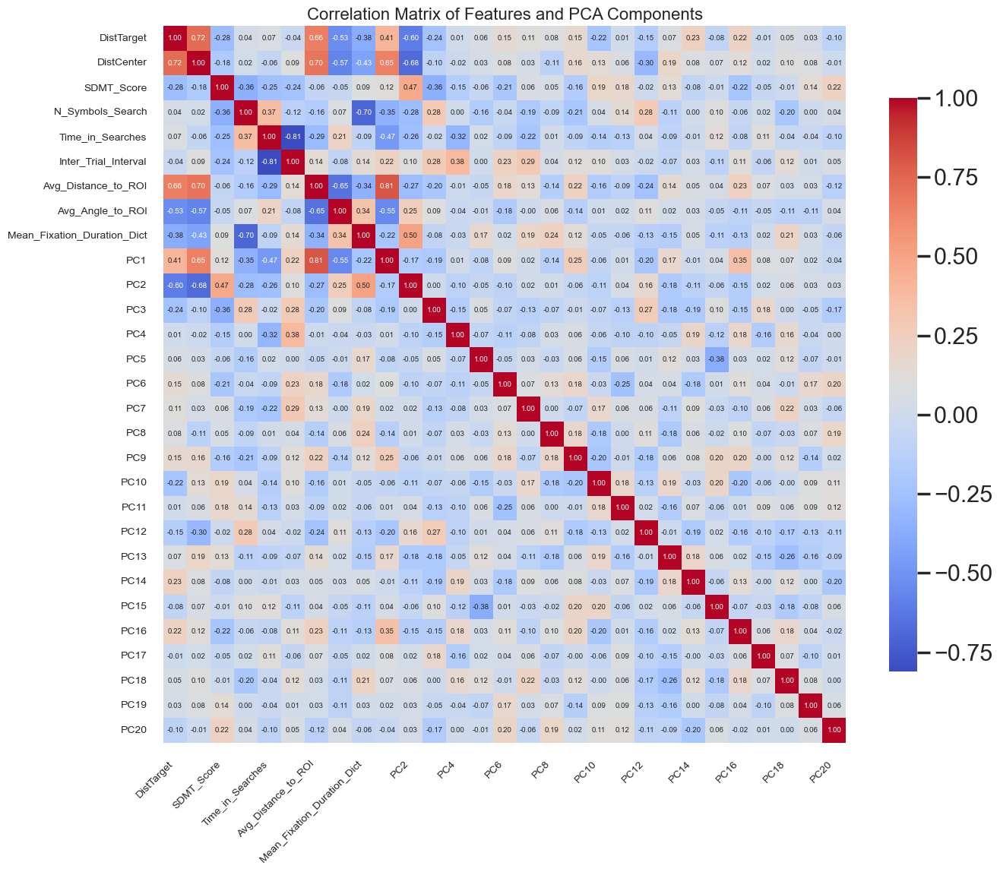

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = ["DistTarget", "DistCenter", "SDMT_Score", "N_Symbols_Search", 
                "Time_in_Searches", "Inter_Trial_Interval", "Avg_Distance_to_ROI", 
                "Avg_Angle_to_ROI", "Mean_Fixation_Duration_Dict"] + pc_columns

corr_matrix = df_participant_avg[numeric_cols].corr()

plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", 
            annot_kws={"size": 7}, cbar_kws={'shrink': 0.8})

plt.title("Correlation Matrix of Features and PCA Components", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

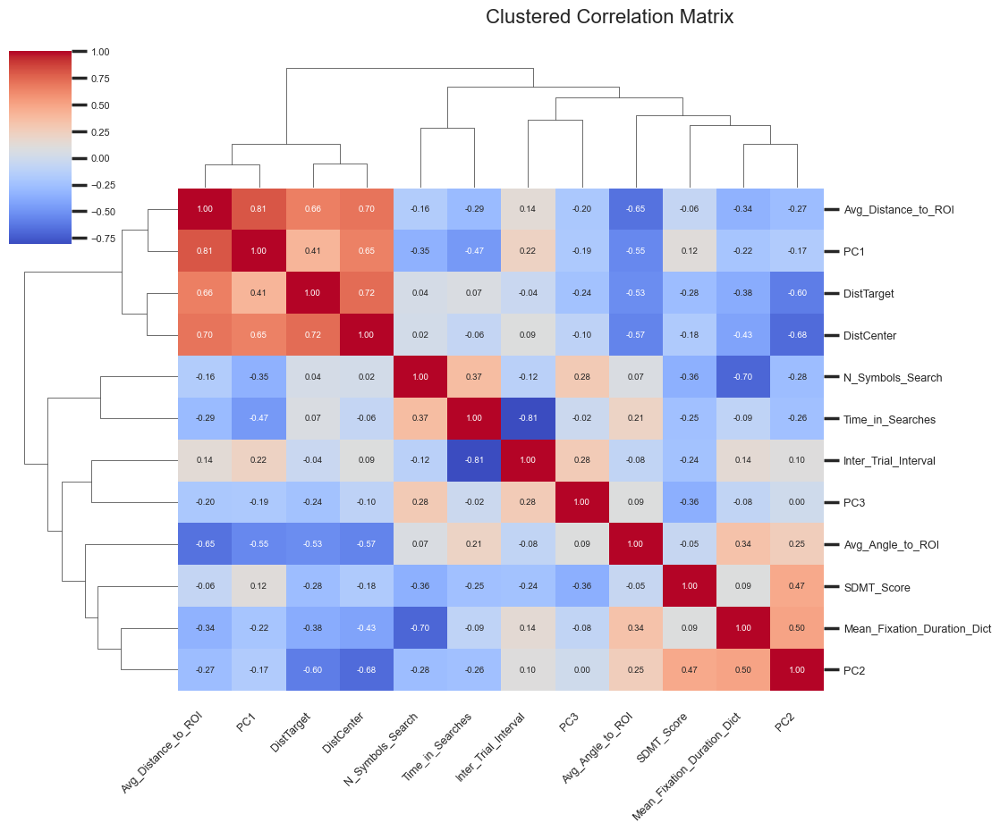

In [151]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = ["DistTarget", "DistCenter", "SDMT_Score", "N_Symbols_Search", 
                "Time_in_Searches", "Inter_Trial_Interval", "Avg_Distance_to_ROI", 
                "Avg_Angle_to_ROI", "Mean_Fixation_Duration_Dict"] + ["PC1", "PC2", "PC3"]

corr_matrix = df_participant_avg[numeric_cols].corr()

# Apply hierarchical clustering and force label visibility
g = sns.clustermap(
    corr_matrix, 
    annot=True, 
    fmt=".2f", 
    cmap="coolwarm", 
    annot_kws={"size": 7}, 
    cbar_kws={'shrink': 0.8}, 
    figsize=(14, 12),
    xticklabels=True, 
    yticklabels=True
)

g.fig.suptitle("Clustered Correlation Matrix", fontsize=16, y=1.02)

# Format the heatmap tick labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=9)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=9)

# Explicitly reduce the color bar text size
g.ax_cbar.tick_params(labelsize=8)

plt.show()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# --- CONFIGURATION ---
output_dir = "/Volumes/ramot/Noam_M/Results/Behavior/fixation_plots_panel_0"
os.makedirs(output_dir, exist_ok=True)

# --- PLOTTING LOGIC ---
for p in participants:
    # Skip participants who do not have Panel "0"
    if "0" not in p.trial_managers:
        continue
        
    print(f"Processing Participant: {p.name}")
    
    fig, ax = plt.subplots(figsize=(16, 9), dpi=150)
    bg_img = p.trial_managers["0"].img_resized
    
    if bg_img is not None:
        # Assuming img_resized already maps to the correct screen coordinates
        ax.imshow(bg_img)
    
    # Iterate through all trials in Panel 0 independently
    for trial in p.trial_managers["0"].trials:
        if not hasattr(trial, 'relevant_fixations') or not trial.relevant_fixations:
            continue
        
            
        has_searches = hasattr(trial, 'searches') and bool(trial.searches)
        cmap = plt.cm.viridis if has_searches else plt.cm.autumn
        
        # Extract coordinates strictly for the current trial
        xs = np.array([fix.position[0] for fix in trial.relevant_fixations])
        ys = np.array([fix.position[1] for fix in trial.relevant_fixations])
        
        # Need at least 2 points to draw a connected path
        if len(xs) < 2:
            ax.scatter(xs, ys, color=cmap(0.5), s=50, edgecolors='k', zorder=3)
            continue
            
        # Create line segments strictly bounded to this trial's coordinates
        points = np.column_stack([xs, ys]).reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        # Normalize sequence for the temporal colormap gradient
        seq = np.linspace(0, 1, len(segments))
        
        # Draw the lines
        lc = LineCollection(segments, cmap=cmap, alpha=0.7, linewidths=2)
        lc.set_array(seq)
        ax.add_collection(lc)
        
        # Overlay the fixation points to mark the exact locations
        ax.scatter(xs, ys, c=np.linspace(0, 1, len(xs)), cmap=cmap, s=30, 
                   edgecolors='k', linewidths=0.5, zorder=3)

    # Formatting
    ax.set_title(f"Participant: {p.name} | Panel 0 Fixations", fontsize=16, fontweight='bold')
    ax.axis('off') 
    
    # Save and close
    out_file = os.path.join(output_dir, f"{p.name}_panel_0_fixations.png")
    plt.savefig(out_file, bbox_inches='tight', facecolor='white')
    plt.close(fig)

print(f"All available plots saved to {output_dir}")

Processing Participant: PA356
Processing Participant: PO515
Processing Participant: ZS065
Processing Participant: DD328
Processing Participant: YR573
Processing Participant: KA956
Processing Participant: CN205
Processing Participant: LE750
Processing Participant: KD735
Processing Participant: BL238
Processing Participant: AM367
Processing Participant: CR991
Processing Participant: CS653
Processing Participant: NS960
Processing Participant: SN975
Processing Participant: AA562
Processing Participant: VA725
Processing Participant: ZL881
Processing Participant: CN482
Processing Participant: KO801
Processing Participant: OY974
Processing Participant: SO754
Processing Participant: KS977
Processing Participant: DS948
Processing Participant: NK494
Processing Participant: GO777
Processing Participant: SI585
Processing Participant: AS038
Processing Participant: LS388
Processing Participant: TM906
Processing Participant: SS408
Processing Participant: FF688
Processing Participant: LY082
Processing

Plotting for Participant: PA356


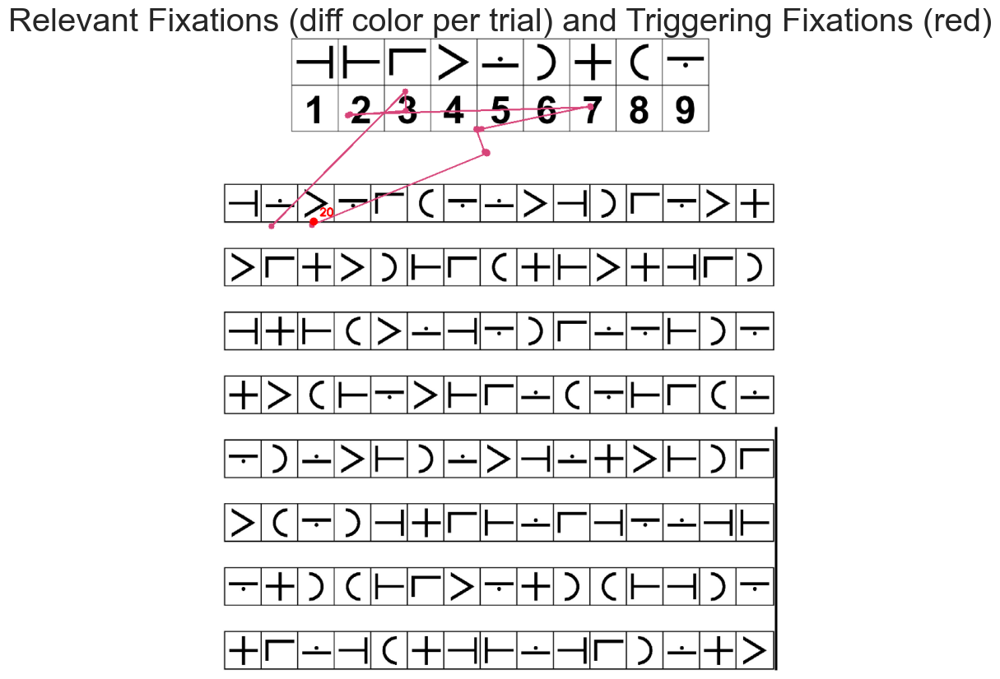

In [171]:
import random
import cv2

def plot_relevant_fixations_on_image(manager):
    """
Plot all relevant fixations from all trials on the image.
Relevant fixations are shown in different colors - dots connected by lines (within each trial).
Triggering fixations are shown as red dots, labeled by their symbol index.
"""
    img_copy = manager.img_resized.copy()

    for trial in manager.trials:
        if trial.idx > 3:
            break
        # Assign a random color for this trial (BGR format)
        color = tuple(random.randint(50, 255) for _ in range(3))

        # Get fixation positions as integer tuples
        points = [tuple(map(int, fix.position)) for fix in trial.relevant_fixations]

        # Draw fixation points
        for p in points:
            cv2.circle(img_copy, p, 5, color, -1)

        # Draw trajectory lines
        for p1, p2 in zip(points, points[1:]):
            cv2.line(img_copy, p1, p2, color, 2)

        # Draw triggering fixation (red)
        if trial.triggering_fixation:
            fx, fy = map(int, trial.triggering_fixation.position)
            cv2.circle(img_copy, (fx, fy), 7, (255, 0, 0), -1)
            cv2.putText(
                img_copy,
                str(trial.triggering_symbol.idx),
                (fx + 10, fy - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (255, 0, 0),
                2
            )

    plt.figure(figsize=(10, 10))
    plt.imshow(img_copy)
    plt.axis('off')
    plt.title("Relevant Fixations (diff color per trial) and Triggering Fixations (red)")
    plt.show()



for p in participants:
    if "0" in p.trial_managers:
        print(f"Plotting for Participant: {p.name}")
        plot_relevant_fixations_on_image(p.trial_managers["0"])
        break

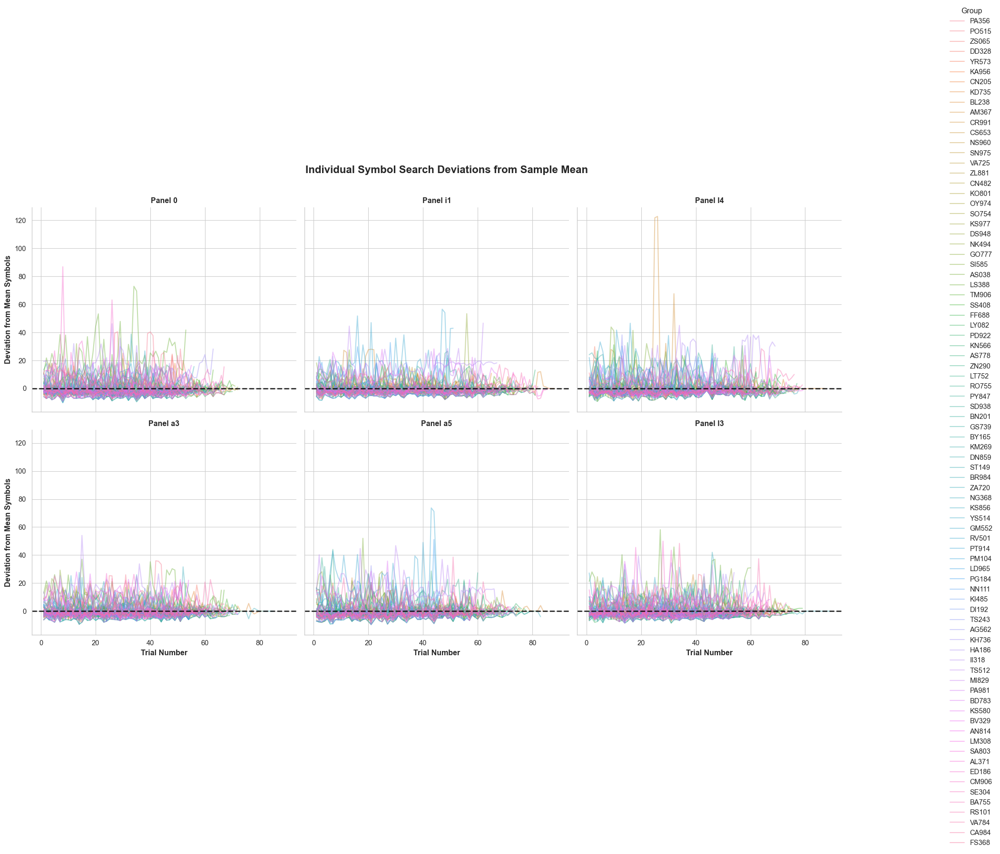

In [177]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0. Load the dataset
# Update this path if the target variable 'N_Symbols_Search' is located in a different file
file_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/all_trials_full_features.csv"
df_plot = pd.read_csv(file_path)

# Verify required columns exist before proceeding
required_cols = {'Panel', 'Trial', 'N_Symbols_Search', 'Participant'}
if not required_cols.issubset(df_plot.columns):
    raise KeyError(f"Missing required columns in CSV. Found: {df_plot.columns}")

# 1. Compute the deviation metric
df_plot['Symbol_Deviation'] = (
    df_plot['N_Symbols_Search'] - 
    df_plot.groupby(['Panel', 'Trial'])['N_Symbols_Search'].transform('mean')
)

# 2. Plotting
sns.set_context("paper", font_scale=1.2)
sns.set_style("whitegrid")

g = sns.FacetGrid(df_plot, col="Panel", col_wrap=3, height=5, aspect=1.2)

g.map_dataframe(
    sns.lineplot, 
    x="Trial", 
    y="Symbol_Deviation", 
    hue="Participant", 
    units="Participant", 
    estimator=None, 
    alpha=0.4, 
    linewidth=1.5
)

for ax in g.axes.flat:
    ax.axhline(0, color='black', linestyle='--', alpha=0.8, linewidth=2)

g.set_axis_labels("Trial Number", "Deviation from Mean Symbols", fontweight='bold')
g.set_titles("Panel {col_name}", fontweight='bold')
g.fig.suptitle("Individual Symbol Search Deviations from Sample Mean", y=1.05, fontweight='bold', fontsize=16)
g.add_legend(title="Group", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.show()

In [176]:
df_plot['Symbol_Deviation']

0        11.219512
1        -3.195122
2         3.890244
3        17.914634
4         9.829268
           ...    
26658     0.792453
26659    -0.729167
26660    -0.638298
26661    -1.318182
26662    -1.100000
Name: Symbol_Deviation, Length: 26663, dtype: float64

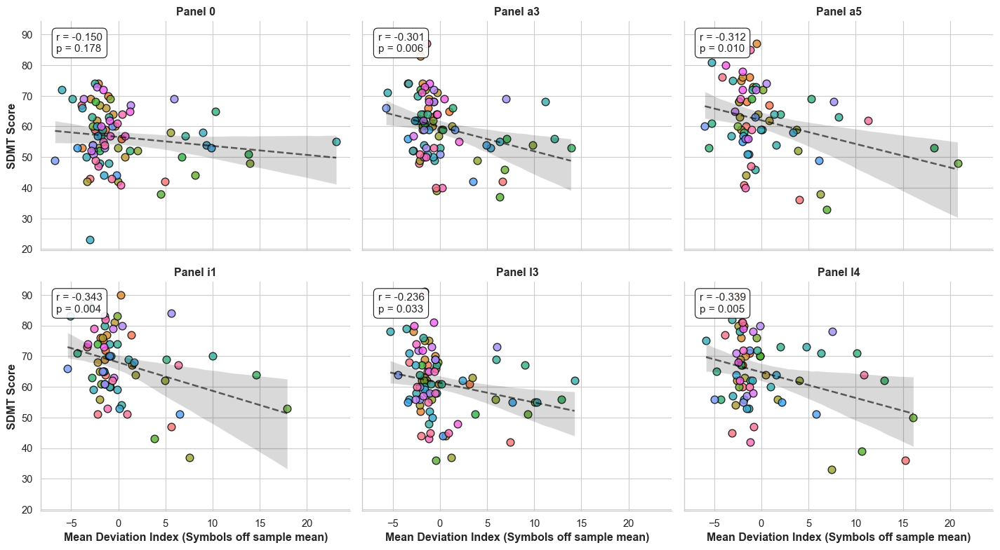

In [184]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# 1. Aggregate to the individual level PER PANEL using mean
df_panel_mean = df_plot.groupby(['Participant', 'Panel', 'SDMT_Score'])['Symbol_Deviation'].mean().reset_index()
df_panel_mean.rename(columns={'Symbol_Deviation': 'Mean_Deviation_Index'}, inplace=True)

# 2. Plotting with lmplot for Faceting
g = sns.lmplot(
    data=df_panel_mean, 
    x='Mean_Deviation_Index', 
    y='SDMT_Score', 
    col='Panel',
    col_wrap=3,
    hue='Participant',
    fit_reg=False,
    height=4, 
    aspect=1.2,
    scatter_kws={'s': 60, 'alpha': 0.8, 'edgecolor': 'k'},
    legend=False
)

# 3. Explicitly loop over axes to guarantee rendering
for ax, panel_name in zip(g.axes.flat, g.col_names):
    # Isolate data strictly for the current panel
    panel_data = df_panel_mean[df_panel_mean['Panel'] == panel_name]
    
    x = panel_data['Mean_Deviation_Index']
    y = panel_data['SDMT_Score']
    
    # Filter valid coordinates
    valid_idx = ~x.isna() & ~y.isna()
    x_val, y_val = x[valid_idx], y[valid_idx]
    
    if len(x_val) > 1:
        # Calculate panel-specific correlation
        r, p = pearsonr(x_val, y_val)
        
        # Draw panel-specific regression line
        sns.regplot(x=x_val, y=y_val, scatter=False, color='black', 
                    line_kws={'linestyle': '--', 'alpha': 0.6}, ax=ax)
        
        # Annotate statistics
        stats_text = f"r = {r:.3f}\np = {p:.3e}" if p < 0.001 else f"r = {r:.3f}\np = {p:.3f}"
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                fontsize=11, va='top', ha='left', zorder=10,
                bbox=dict(boxstyle="round,pad=0.4", edgecolor="black", facecolor="white", alpha=0.9))

# Formatting
g.set_titles("Panel {col_name}", fontweight='bold')
g.set_axis_labels("Mean Deviation Index (Symbols off sample mean)", "SDMT Score", fontweight='bold')

plt.tight_layout()
plt.show()

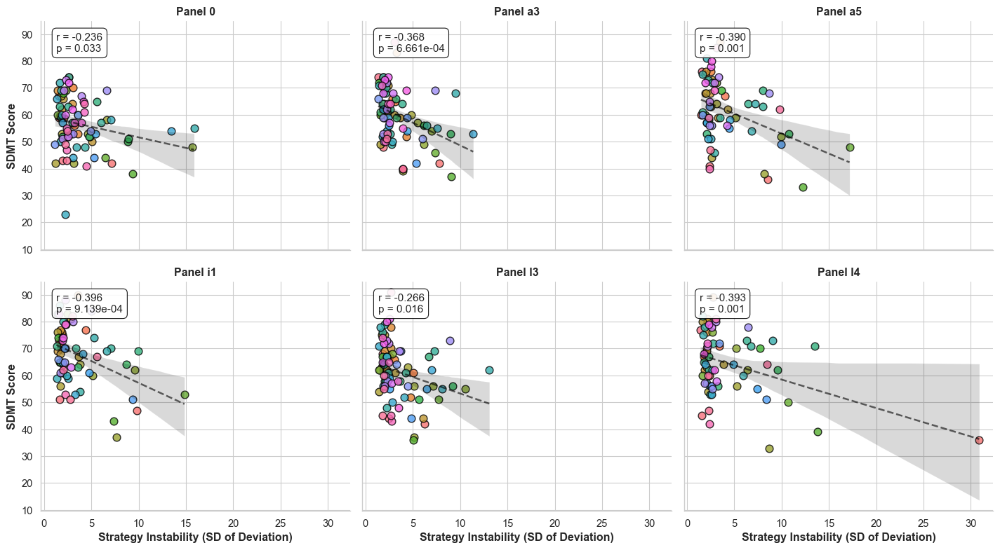

In [183]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# 1. Aggregate to the individual level PER PANEL
df_panel_sd = df_plot.groupby(['Participant', 'Panel', 'SDMT_Score'])['Symbol_Deviation'].std().reset_index()
df_panel_sd.rename(columns={'Symbol_Deviation': 'Strategy_Instability_Index'}, inplace=True)

# 2. Plotting with lmplot for Faceting
g = sns.lmplot(
    data=df_panel_sd, 
    x='Strategy_Instability_Index', 
    y='SDMT_Score', 
    col='Panel',
    col_wrap=3,
    hue='Participant',
    fit_reg=False,
    height=4, 
    aspect=1.2,
    scatter_kws={'s': 60, 'alpha': 0.8, 'edgecolor': 'k'},
    legend=False
)

# 3. Explicitly loop over axes to guarantee rendering
for ax, panel_name in zip(g.axes.flat, g.col_names):
    # Isolate data strictly for the current panel
    panel_data = df_panel_sd[df_panel_sd['Panel'] == panel_name]
    
    x = panel_data['Strategy_Instability_Index']
    y = panel_data['SDMT_Score']
    
    # Filter valid coordinates
    valid_idx = ~x.isna() & ~y.isna()
    x_val, y_val = x[valid_idx], y[valid_idx]
    
    if len(x_val) > 1:
        # Calculate panel-specific correlation
        r, p = pearsonr(x_val, y_val)
        
        # Draw panel-specific regression line
        sns.regplot(x=x_val, y=y_val, scatter=False, color='black', 
                    line_kws={'linestyle': '--', 'alpha': 0.6}, ax=ax)
        
        # Annotate statistics
        stats_text = f"r = {r:.3f}\np = {p:.3e}" if p < 0.001 else f"r = {r:.3f}\np = {p:.3f}"
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                fontsize=11, va='top', ha='left', zorder=10,
                bbox=dict(boxstyle="round,pad=0.4", edgecolor="black", facecolor="white", alpha=0.9))

# Formatting
g.set_titles("Panel {col_name}", fontweight='bold')
g.set_axis_labels("Strategy Instability (SD of Deviation)", "SDMT Score", fontweight='bold')

plt.tight_layout()
plt.show()

In [185]:
import pandas as pd

# 1. Define the exact columns to extract
columns_to_keep = [
    'Participant', 
    'Group', 
    'Panel', 
    'Trial', 
    'SDMT_Score', 
    'N_Symbols_Search', 
    'Symbol_Deviation'
]

# Create a clean, unlinked copy of the reduction
df_reduced = df_plot[columns_to_keep].copy()

# 2. Compute the Normalized Symbol Deviation (Z-score per Panel and Trial)
# We use ddof=1 for sample standard deviation.
df_reduced['Symbol_Deviation_Normalized'] = (
    df_reduced.groupby(['Panel', 'Trial'])['Symbol_Deviation']
    .transform(lambda x: (x - x.mean()) / x.std(ddof=1))
)

# 3. Export to CSV
# Update this path to your preferred output directory
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_14_03_2026.csv"

df_reduced.to_csv(output_path, index=False)
print(f"Reduced and normalized table saved to: {output_path}")

Reduced and normalized table saved to: /Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_14_03_2026.csv


In [8]:
import pandas as pd

# 1. Load your existing reduced table
table_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_for_merge.csv"
df_main = pd.read_csv(table_path)

new_features_data = []

for participant in participants:
    for panel_id in participant.trial_managers.keys():

        trial_manager = participant.trial_managers[panel_id]
        features = trial_manager.features
        trials = trial_manager.trials

        # 3. Map the TRIAL-ALIGNED dictionaries to their specific trial rows
        for trial in trials:
            row_data = {
                'Participant': participant.name,
                'Panel': panel_id,
                'Trial': trial.idx,
                # Directly use trial.idx as the dictionary key
                'BCEA_Dispersion': features.dispersions_bcea[trial.idx],
                'RMS_Dispersion': features.dispersions_rms[trial.idx],
                'Symbols_Count': features.symbol_counts_per_trial[trial.idx],
                'In_Search_Duration': features.trial_in_search_durations[trial.idx],
                'Relevant_Fixation_Time': features.time_in_relevant_fixations[trial.idx],
                'Inter_Trial_Interval': features.inter_trial_intervals[trial.idx]
            }
            # CRITICAL FIX: Indented to only append when row_data is actually created for trial >= 3
            new_features_data.append(row_data)

# 4. Convert the new features into a DataFrame
df_features = pd.DataFrame(new_features_data)

# 5. Merge the new features into the main table
df_final = pd.merge(
    df_main, 
    df_features, 
    on=['Participant', 'Panel', 'Trial'], 
    how='left'
)

# 6. Save the augmented table back to disk
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
df_final.to_csv(output_path, index=False)
print(f"Feature merge complete. Saved to: {output_path}")

Feature merge complete. Saved to: /Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv


In [9]:
df_final.head()

,Participant,Group,Panel,Trial,SDMT_Score,N_Symbols_Search,BCEA_Dispersion,RMS_Dispersion,Symbols_Count,In_Search_Duration,Relevant_Fixation_Time,Inter_Trial_Interval
0,PA356,pwMS,0,1,54.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN
1,PA356,pwMS,0,2,54.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN
2,PA356,pwMS,0,3,54.0,10.0,167.356065,7.366151,3.0,746673.0,46664.0,NaN
3,PA356,pwMS,0,4,54.0,26.0,0.000000,6.717439,8.0,1178345.0,1667.0,510001.0
4,PA356,pwMS,0,5,54.0,17.0,94.745724,5.161534,3.0,605002.0,118334.0,523337.0


In [10]:
import pandas as pd
from scipy.stats import linregress

# Define paths
input_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_trend_slopes.csv"

# Load trial data
df_trials = pd.read_csv(input_path)

# Ensure valid coordinates for regression
df_valid = df_trials.dropna(subset=['Trial', 'N_Symbols_Search'])

slopes_data = []

# Group by Participant and Panel to calculate one slope per block
for (participant, panel), group_df in df_valid.groupby(['Participant', 'Panel']):
    # Strictly order by trial to ensure temporal sequence is correct
    group_df = group_df.sort_values('Trial')
    
    x = group_df['Trial'].values
    y = group_df['N_Symbols_Search'].values
    
    # Regression requires at least two points
    if len(x) > 1:
        res = linregress(x, y)
        slope = res.slope
        p_val = res.pvalue
    else:
        slope = float('nan')
        p_val = float('nan')
        
    slopes_data.append({
        'Participant': participant,
        'Panel': panel,
        'Symbols_Trend_Slope': slope,
        'Trend_P_Value': p_val
    })

# Export to a separate panel-level dataframe
df_slopes = pd.DataFrame(slopes_data)
df_slopes.to_csv(output_path, index=False)

In [11]:
df_slopes.head()

,Participant,Panel,Symbols_Trend_Slope,Trend_P_Value
0,AG562,0,-0.012806,1.454661e-01
1,AG562,a3,-0.049730,1.270092e-13
2,AG562,a5,-0.037956,6.984404e-08
3,AG562,i1,-0.027632,7.533026e-04
4,AG562,l3,-0.044839,1.216093e-04


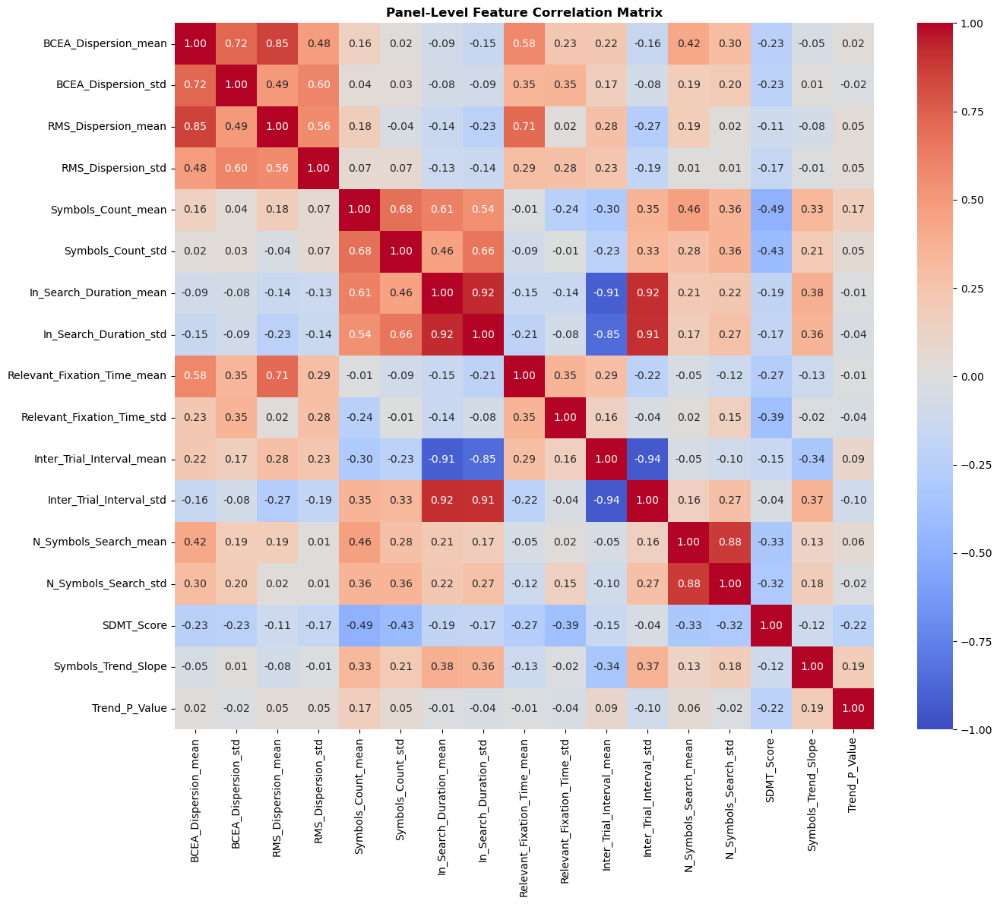

Aggregated panel-level dataset saved to: /Volumes/ramot/Noam_M/preliminary_results/all_features/panel_grouped_features_15_03_2026.csv


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Load the trial-level data and the slope data
df_final_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
df_slopes_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_trend_slopes.csv"

df_final = pd.read_csv(df_final_path)
df_slopes = pd.read_csv(df_slopes_path)

# 2. Define the numerical features to aggregate
# Exclude Participant, Group, Panel, Trial, and SDMT_Score
features_to_agg = [
    'BCEA_Dispersion', 'RMS_Dispersion', 'Symbols_Count',
    'In_Search_Duration', 'Relevant_Fixation_Time', 'Inter_Trial_Interval',
    'N_Symbols_Search'
]

# Filter to only columns that actually exist in your dataframe
actual_features = [col for col in features_to_agg if col in df_final.columns]

# 3. Group by Participant and Panel, calculating mean and std
agg_funcs = {feat: ['mean', 'std'] for feat in actual_features}

# Extract constants (SDMT_Score, Group) without calculating variance
if 'SDMT_Score' in df_final.columns:
    agg_funcs['SDMT_Score'] = ['first']
if 'Group' in df_final.columns:
    agg_funcs['Group'] = ['first']

df_agg = df_final.groupby(['Participant', 'Panel']).agg(agg_funcs).reset_index()

# Flatten the multi-level column headers created by .agg()
# E.g., ('BCEA_Dispersion', 'mean') becomes 'BCEA_Dispersion_mean'
df_agg.columns = ['_'.join(col).strip('_').replace('_first', '') for col in df_agg.columns.values]

# 4. Merge with the slopes table
df_panel_level = pd.merge(df_agg, df_slopes, on=['Participant', 'Panel'], how='inner')


# Save the aggregated dataset for your downstream XGBoost/PCA models
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_grouped_features_15_03_2026.csv"
df_panel_level.to_csv(output_path, index=False)
print(f"Aggregated panel-level dataset saved to: {output_path}")

In [13]:
df_panel_level.head()

,Participant,Panel,BCEA_Dispersion_mean,BCEA_Dispersion_std,RMS_Dispersion_mean,RMS_Dispersion_std,Symbols_Count_mean,Symbols_Count_std,In_Search_Duration_mean,In_Search_Duration_std,Relevant_Fixation_Time_mean,Relevant_Fixation_Time_std,Inter_Trial_Interval_mean,Inter_Trial_Interval_std,N_Symbols_Search_mean,N_Symbols_Search_std,SDMT_Score,Group,Symbols_Trend_Slope,Trend_P_Value
0,AG562,0,298.874152,567.532107,11.090344,10.020030,2.095238,1.227564,595321.634921,333825.980976,457304.698413,195762.323127,649225.290323,326637.217960,2.338462,1.326142,67.0,pwMS,-0.012806,1.454661e-01
1,AG562,a3,229.585646,339.634533,10.018005,8.719698,1.871429,1.350485,508408.757143,422394.592780,527622.785714,369406.452160,546678.565217,265108.000941,2.041667,1.408600,74.0,pwMS,-0.049730,1.270092e-13
2,AG562,a5,380.770615,363.292803,14.057507,9.495164,1.416667,1.725941,379886.458333,515042.031616,668290.833333,255515.896754,413608.028169,354939.146955,1.391892,1.412445,76.0,pwMS,-0.037956,6.984404e-08
3,AG562,i1,195.000852,216.570799,10.089288,8.756493,1.985507,1.387897,524689.000000,391114.382205,433602.492754,187855.772066,569682.970588,402164.233554,2.112676,1.459445,73.0,pwMS,-0.027632,7.533026e-04
4,AG562,l3,199.536482,195.333278,10.338166,7.920217,2.265625,1.757001,638077.781250,481720.926957,429690.406250,206690.005211,621339.714286,283873.479266,2.424242,1.889734,68.0,pwMS,-0.044839,1.216093e-04


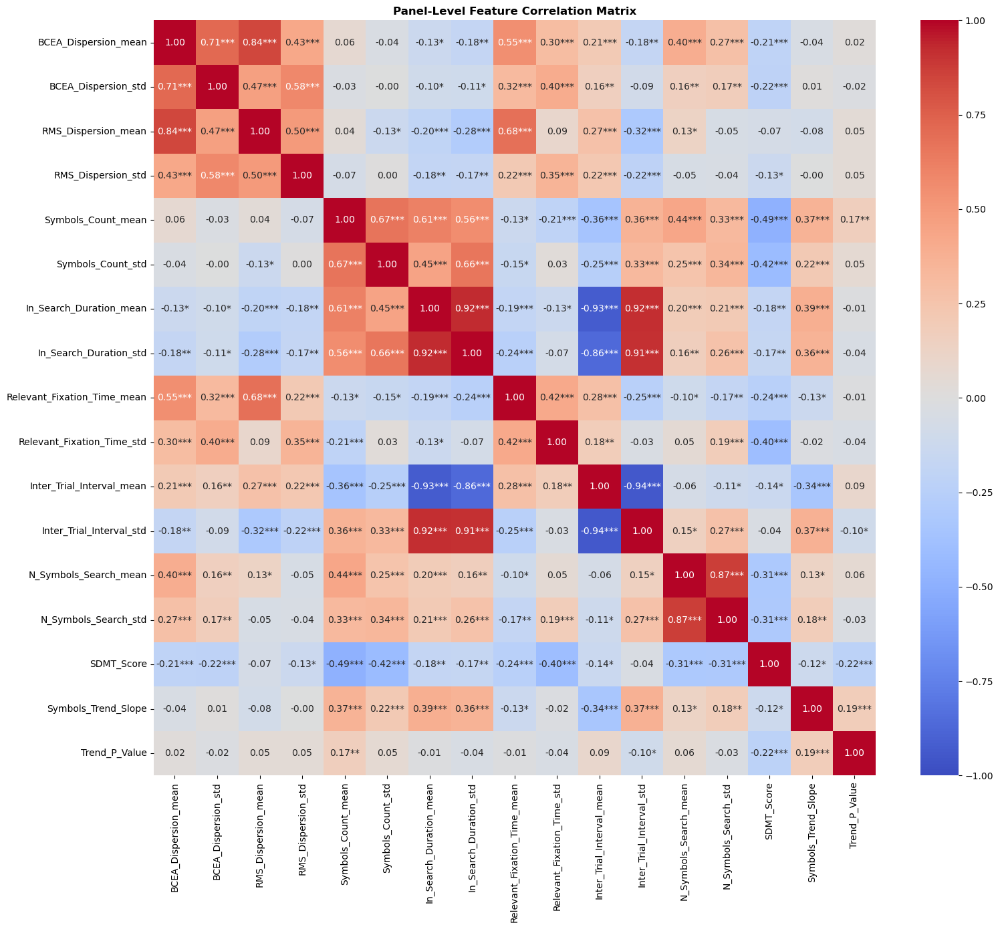

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Select only numeric columns and drop NaNs (pearsonr will fail on NaNs)
numeric_cols = df_panel_level.select_dtypes(include=['float64', 'int64']).columns
df_numeric = df_panel_level[numeric_cols].dropna()

# Initialize empty matrices
cols = df_numeric.columns
corr_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)
annot_matrix = pd.DataFrame(index=cols, columns=cols, dtype=str)

# Calculate pairwise Pearson r and p-values
for col1 in cols:
    for col2 in cols:
        r, p = pearsonr(df_numeric[col1], df_numeric[col2])
        corr_matrix.loc[col1, col2] = r
        
        # Apply your specific significance thresholds
        stars = ""
        if p < 0.0001:
            stars = "***"
        elif p < 0.001:
            stars = "**"
        elif p < 0.05:
            stars = "*"
            
        # Omit stars on the diagonal (self-correlation is always 1)
        if col1 == col2:
            annot_matrix.loc[col1, col2] = f"{r:.2f}"
        else:
            annot_matrix.loc[col1, col2] = f"{r:.2f}{stars}"

# Plot the correlation matrix
plt.figure(figsize=(16, 14))
# fmt="" is required when passing custom string annotations
sns.heatmap(corr_matrix.astype(float), annot=annot_matrix, fmt="", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Panel-Level Feature Correlation Matrix", fontweight='bold')
plt.tight_layout()
plt.show()

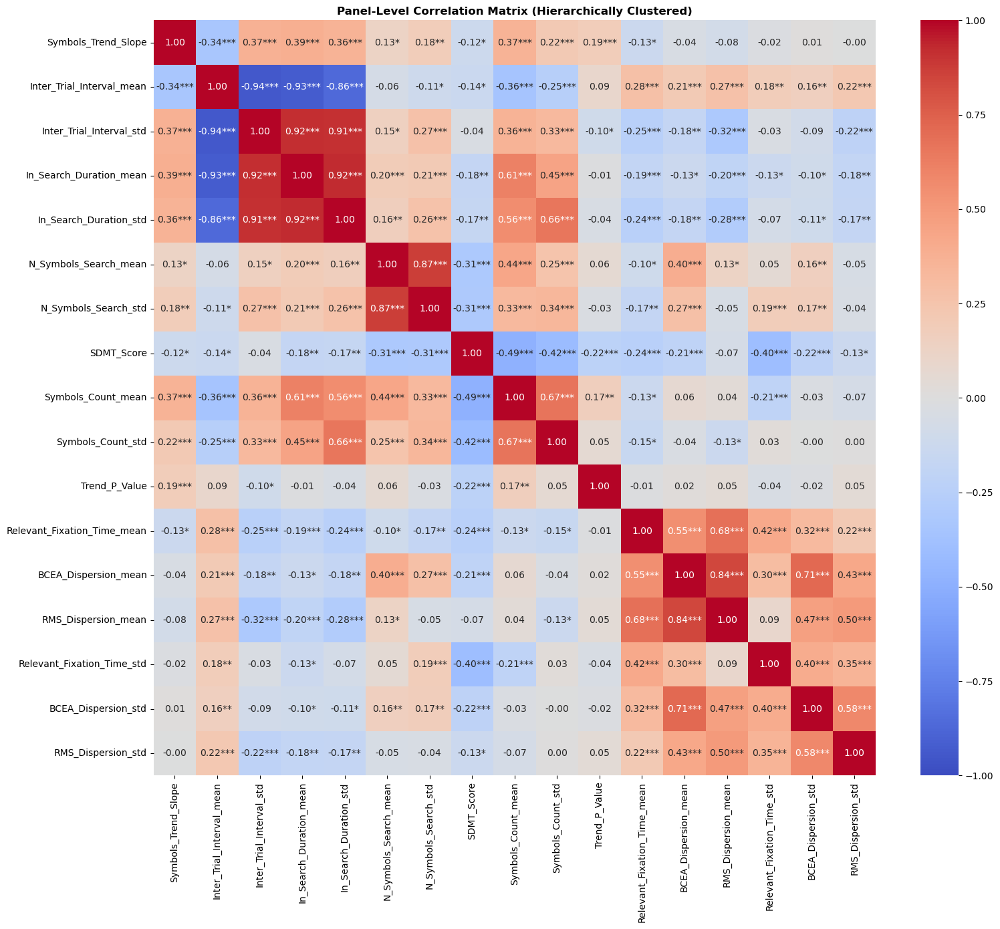

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import squareform

# 1. Select numeric columns and drop NaNs
numeric_cols = df_panel_level.select_dtypes(include=['float64', 'int64']).columns
df_numeric = df_panel_level[numeric_cols].dropna()

cols = df_numeric.columns
corr_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)
annot_matrix = pd.DataFrame(index=cols, columns=cols, dtype=str)

# 2. Calculate pairwise Pearson r and p-values
for col1 in cols:
    for col2 in cols:
        r, p = pearsonr(df_numeric[col1], df_numeric[col2])
        corr_matrix.loc[col1, col2] = r
        
        stars = ""
        if p < 0.0001:
            stars = "***"
        elif p < 0.001:
            stars = "**"
        elif p < 0.05:
            stars = "*"
            
        if col1 == col2:
            annot_matrix.loc[col1, col2] = f"{r:.2f}"
        else:
            annot_matrix.loc[col1, col2] = f"{r:.2f}{stars}"

# 3. Compute hierarchical linkage
# Convert correlation matrix to a condensed distance matrix
distance_matrix = 1 - corr_matrix.abs()
# squareform expects a symmetric matrix with 0s on the diagonal
np.fill_diagonal(distance_matrix.values, 0)
condensed_dist = squareform(distance_matrix)

linkage_matrix = linkage(condensed_dist, method='complete')
ordered_indices = leaves_list(linkage_matrix)
ordered_cols = cols[ordered_indices]

# 4. Reorder both matrices using the new clustered index
corr_matrix_clustered = corr_matrix.loc[ordered_cols, ordered_cols]
annot_matrix_clustered = annot_matrix.loc[ordered_cols, ordered_cols]

# 5. Plot the clustered correlation matrix
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix_clustered.astype(float), annot=annot_matrix_clustered, fmt="", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Panel-Level Correlation Matrix (Hierarchically Clustered)", fontweight='bold')
plt.tight_layout()
plt.show()

In [17]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import squareform
from itertools import combinations

df_panel_level = pd.read_csv("/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_grouped_features_15_03_2026.csv")

# 1. Define and create output directory
output_dir = "/Volumes/ramot/Noam_M/preliminary_results/all_features/correlation_plots/"
os.makedirs(output_dir, exist_ok=True)

# Select numeric columns and drop NaNs
numeric_cols = df_panel_level.select_dtypes(include=['float64', 'int64']).columns
df_numeric = df_panel_level[numeric_cols].dropna()

cols = df_numeric.columns
corr_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)
annot_matrix = pd.DataFrame(index=cols, columns=cols, dtype=str)

significant_pairs = []

# 2. Calculate pairwise Pearson r and p-values
for col1 in cols:
    for col2 in cols:
        r, p = pearsonr(df_numeric[col1], df_numeric[col2])
        corr_matrix.loc[col1, col2] = r
        
        stars = ""
        if p < 0.0001:
            stars = "***"
        elif p < 0.001:
            stars = "**"
        elif p < 0.05:
            stars = "*"
            
        if col1 == col2:
            annot_matrix.loc[col1, col2] = f"{r:.2f}"
        else:
            annot_matrix.loc[col1, col2] = f"{r:.2f}{stars}"

# Extract unique significant pairs (avoiding duplicates and self-correlations)
for col1, col2 in combinations(cols, 2):
    r, p = pearsonr(df_numeric[col1], df_numeric[col2])
    if p < 0.05:
        significant_pairs.append((col1, col2, r, p))

# 3. Compute hierarchical linkage
distance_matrix = 1 - corr_matrix.abs()
np.fill_diagonal(distance_matrix.values, 0)
condensed_dist = squareform(distance_matrix)

linkage_matrix = linkage(condensed_dist, method='complete')
ordered_indices = leaves_list(linkage_matrix)
ordered_cols = cols[ordered_indices]

corr_matrix_clustered = corr_matrix.loc[ordered_cols, ordered_cols]
annot_matrix_clustered = annot_matrix.loc[ordered_cols, ordered_cols]

# 4. Plot and SAVE the clustered correlation matrix
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix_clustered.astype(float), annot=annot_matrix_clustered, fmt="", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Panel-Level Correlation Matrix (Hierarchically Clustered)", fontweight='bold')
plt.tight_layout()

heatmap_path = os.path.join(output_dir, "00_heatmap_clustered.png")
plt.savefig(heatmap_path, dpi=300)
plt.close() # Critical: close the figure to free memory
print(f"Saved heatmap to: {heatmap_path}")

# 5. Generate and save scatterplots for significant pairs
print(f"Generating {len(significant_pairs)} scatterplots for significant correlations...")

for col1, col2, r, p in significant_pairs:
    plt.figure(figsize=(8, 6))
    
    # Scatterplot with regression line
    sns.regplot(x=df_numeric[col1], y=df_numeric[col2], 
                scatter_kws={'alpha': 0.6, 'edgecolor': 'k', 's': 50}, 
                line_kws={'color': 'darkred'})
    
    plt.title(f"{col1} vs {col2}", fontweight='bold')
    plt.xlabel(col1, fontweight='bold')
    plt.ylabel(col2, fontweight='bold')
    
    # Annotate statistics
    stats_text = f"r = {r:.3f}\np < 0.001" if p < 0.001 else f"r = {r:.3f}\np = {p:.3f}"
    plt.annotate(stats_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                fontsize=12, va='top', ha='left',
                bbox=dict(boxstyle="round,pad=0.4", edgecolor="black", facecolor="white", alpha=0.9))
    
    sns.despine()
    plt.tight_layout()
    
    # Sanitize filenames to prevent OS errors
    safe_col1 = col1.replace('/', '_').replace('\\', '_')
    safe_col2 = col2.replace('/', '_').replace('\\', '_')
    filename = f"scatter_{safe_col1}_vs_{safe_col2}.png"
    
    plot_path = os.path.join(output_dir, filename)
    plt.savefig(plot_path, dpi=200)
    plt.close() 

print(f"Finished saving all plots to: {output_dir}")

Saved heatmap to: /Volumes/ramot/Noam_M/preliminary_results/all_features/correlation_plots/00_heatmap_clustered.png
Generating 100 scatterplots for significant correlations...
Finished saving all plots to: /Volumes/ramot/Noam_M/preliminary_results/all_features/correlation_plots/


In [19]:

# 1. Load the previous aggregated table
input_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_grouped_features_15_03_2026.csv"
output_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/panel_grouped_features_17_03_2026.csv"

df = pd.read_csv(input_path)

# Drop the behavioral metric to prevent multicollinearity with Symbols_Count
if 'N_Symbols_Search_mean' in df.columns:
    df = df.drop(columns=['N_Symbols_Search_mean', 'N_Symbols_Search_std'])

df.to_csv(output_path, index=False)

In [23]:
df_all_features_grouped = df
df_all_features_grouped.loc[df_all_features_grouped['In_Search_Duration_mean'] > 1*1e7, ['Participant', 'Panel', 'In_Search_Duration_mean']]

,Participant,Panel,In_Search_Duration_mean
188,KH736,a5,1.269436e+07
189,KH736,i1,1.293706e+07


In [24]:
df_all_features_grouped.loc[df_all_features_grouped['Inter_Trial_Interval_mean'] < 0, ['Participant', 'Panel', 'Inter_Trial_Interval_mean']]

,Participant,Panel,Inter_Trial_Interval_mean
17,AM367,l4,-1.742477e+05
164,GS739,l4,-4.475851e+05
188,KH736,a5,-1.176022e+07
189,KH736,i1,-1.211291e+07
191,KH736,l4,-1.364336e+05
292,PA356,a3,-2.888769e+04


In [26]:
df_all_features_grouped.loc[df_all_features_grouped['Inter_Trial_Interval_std'] > 1e7 , ['Participant', 'Panel', 'Inter_Trial_Interval_std']]

,Participant,Panel,Inter_Trial_Interval_std
188,KH736,a5,1.056921e+07
189,KH736,i1,1.452885e+07


In [28]:
df_all_features_grouped.loc[df_all_features_grouped['Symbols_Count_std'] > 10 , ['Participant', 'Panel', 'Symbols_Count_std']]

,Participant,Panel,Symbols_Count_std
273,NK494,0,20.635659


In [29]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Define paths
trial_table_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
outlier_dir = "/Volumes/ramot/Noam_M/preliminary_results/all_features/outliers/"
os.makedirs(outlier_dir, exist_ok=True)

# Load data
df_trial = pd.read_csv(trial_table_path)
df_trial['Panel'] = df_trial['Panel'].astype(str)

# Define identified outliers (Participant, Panel)
outliers = [
    ('KH736', 'a5'), ('KH736', 'i1'), ('KH736', 'l4'),
    ('NK494', '0'), ('AM367', 'l4'), ('GS739', 'l4'), ('PA356', 'a3')
]

# Identify features to plot (dynamically checking existence)
candidate_features = [
    'BCEA_Dispersion', 'RMS_Dispersion', 'Symbols_Count',
    'In_Search_Duration', 'Relevant_Fixation_Time', 'Inter_Trial_Interval'
]
features_to_plot = [f for f in candidate_features if f in df_trial.columns]

if not features_to_plot:
    raise ValueError("None of the candidate features were found in the dataset.")

for part, pan in outliers:
    # Isolate data
    subset = df_trial[(df_trial['Participant'] == part) & (df_trial['Panel'] == pan)].copy()
    
    if subset.empty:
        print(f"No data found for {part} panel {pan}. Skipping.")
        continue
    
    subset = subset.sort_values('Trial')
    
    # Generate multi-axis figure
    fig, axes = plt.subplots(len(features_to_plot), 1, figsize=(8, 2.5 * len(features_to_plot)), sharex=True)
    if len(features_to_plot) == 1: 
        axes = [axes]
        
    for ax, feat in zip(axes, features_to_plot):
        sns.scatterplot(data=subset, x='Trial', y=feat, ax=ax, color='black', s=50)
        sns.lineplot(data=subset, x='Trial', y=feat, ax=ax, color='gray', alpha=0.5)
        ax.set_ylabel(feat)
        ax.grid(True, linestyle='--', alpha=0.5)
        
    axes[-1].set_xlabel('Trial Number')
    axes[-1].set_xticks(subset['Trial'].unique())
    
    plt.suptitle(f"{part} | Panel {pan}", fontweight='bold')
    sns.despine()
    plt.tight_layout()
    
    # Save figure
    filename = f"{part}_Panel_{pan.replace('/', '_')}_trials.png"
    plt.savefig(os.path.join(outlier_dir, filename), dpi=300)
    plt.close()

print(f"Scatters generated and saved to {outlier_dir}")

Scatters generated and saved to /Volumes/ramot/Noam_M/preliminary_results/all_features/outliers/


In [30]:
df_trial.loc[df_trial['Participant'].isin(['KH736', 'NK494', 'AM367', 'GS739', 'PA356']), ['Participant', 'SDMT_Score']].drop_duplicates()

,Participant,SDMT_Score
0,PA356,54.0
52,PA356,68.0
118,PA356,64.0
180,PA356,53.0
231,PA356,58.0
287,PA356,62.0
3005,AM367,42.0
3045,AM367,47.0
3090,AM367,36.0
7217,NK494,23.0


In [33]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress

# 1. Define Paths
input_csv = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
slopes_csv = "/Volumes/ramot/Noam_M/preliminary_results/all_features/features_slpoes.csv"
hist_dir = "/Volumes/ramot/Noam_M/preliminary_results/all_features/slopes_analysis/histograms_of_slopes"
volcano_dir = "/Volumes/ramot/Noam_M/preliminary_results/all_features/slopes_analysis/volcano_plots"

# Create directories if they do not exist
os.makedirs(hist_dir, exist_ok=True)
os.makedirs(volcano_dir, exist_ok=True)

# 2. Load Data and Define Features
df = pd.read_csv(input_csv)
features = [
    'BCEA_Dispersion', 'RMS_Dispersion', 'Symbols_Count', 
    'In_Search_Duration', 'Relevant_Fixation_Time', 'Inter_Trial_Interval'
]
actual_features = [f for f in features if f in df.columns]

# 3. Calculate Independent OLS Regressions per Panel
results = []
for (part, pan), group in df.groupby(['Participant', 'Panel']):
    # Strictly enforce chronological order
    group = group.sort_values('Trial')
    row_data = {'Participant': part, 'Panel': pan}
    
    for feat in actual_features:
        # Drop NaNs dynamically per feature to prevent linregress crashes
        valid_data = group.dropna(subset=['Trial', feat])
        
        if len(valid_data) > 1:
            res = linregress(valid_data['Trial'], valid_data[feat])
            row_data[f'{feat}_slope'] = res.slope
            row_data[f'{feat}_pval'] = res.pvalue
        else:
            row_data[f'{feat}_slope'] = np.nan
            row_data[f'{feat}_pval'] = np.nan
            
    results.append(row_data)

# Save the slopes table
df_slopes = pd.DataFrame(results)
df_slopes.to_csv(slopes_csv, index=False)
print(f"Slopes calculated and saved to: {slopes_csv}")

# 4. Generate Visualizations
sns.set_theme(style="whitegrid")
alpha_threshold = 0.05
log_alpha = -np.log10(alpha_threshold)

for feat in actual_features:
    slope_col = f'{feat}_slope'
    pval_col = f'{feat}_pval'
    
    # Isolate valid data for the current feature
    data_to_plot = df_slopes[[slope_col, pval_col]].dropna()
    
    if data_to_plot.empty:
        continue

    # --- Histogram ---
    plt.figure(figsize=(8, 6))
    sns.histplot(data_to_plot[slope_col], kde=True, color='steelblue', edgecolor='black')
    plt.axvline(0, color='darkred', linestyle='--', linewidth=2, label='Zero Slope (Stationary)')
    plt.title(f"Slope Distribution (Histogram): {feat}", fontweight='bold')
    plt.xlabel("Linear Regression Slope (\u03B21)", fontweight='bold')
    plt.ylabel("Frequency", fontweight='bold')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(hist_dir, f"hist_{feat}.png"), dpi=200)
    plt.close()

    # --- Volcano Plot ---
    # Clip p-values to avoid log10(0) errors on perfect fits
    pvals = np.clip(data_to_plot[pval_col], 1e-300, 1.0)
    log_pvals = -np.log10(pvals)
    
    plt.figure(figsize=(8, 6))
    
    # Color points based on significance (red if significant, gray otherwise)
    is_significant = pvals < alpha_threshold
    colors = np.where(is_significant, 'darkred', 'gray')
    
    plt.scatter(data_to_plot[slope_col], log_pvals, color=colors, alpha=0.7, edgecolor='k')
    
    # Add thresholds
    plt.axhline(log_alpha, color='black', linestyle='--', linewidth=1.5, label=f'p = {alpha_threshold}')
    plt.axvline(0, color='black', linestyle='-', linewidth=1)
    
    plt.title(f"Volcano Plot: {feat} Stationarity", fontweight='bold')
    plt.xlabel("Effect Size (Regression Slope \u03B21)", fontweight='bold')
    plt.ylabel("$-\\log_{10}(p\\text{-value})$", fontweight='bold')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(volcano_dir, f"volcano_{feat}.png"), dpi=200)
    plt.close()

print("All histograms and volcano plots generated successfully.")

Slopes calculated and saved to: /Volumes/ramot/Noam_M/preliminary_results/all_features/features_slpoes.csv
All histograms and volcano plots generated successfully.


In [35]:
df_slopes.tail()

,Participant,Panel,BCEA_Dispersion_slope,BCEA_Dispersion_pval,RMS_Dispersion_slope,RMS_Dispersion_pval,Symbols_Count_slope,Symbols_Count_pval,In_Search_Duration_slope,In_Search_Duration_pval,Relevant_Fixation_Time_slope,Relevant_Fixation_Time_pval,Inter_Trial_Interval_slope,Inter_Trial_Interval_pval
442,ZS065,a3,4.279975,0.173121,0.226469,0.059851,-0.051737,0.365108,-16764.679537,0.262662,11639.115959,0.000364,23653.871429,0.064938
443,ZS065,a5,-1.968116,0.653946,-0.017257,0.844942,-0.060254,0.015695,-10534.803081,0.098029,-1359.316068,0.615079,-4991.092861,0.341714
444,ZS065,i1,-8.827260,0.083197,-0.155959,0.072328,-0.020467,0.205538,-3869.347132,0.221750,-1559.882747,0.511655,3499.289362,0.075458
445,ZS065,l3,1.456612,0.696977,0.050244,0.625368,-0.015854,0.649990,-4310.742857,0.635252,1781.639373,0.377816,-689.680488,0.879092
446,ZS065,l4,-0.801598,0.892616,0.008021,0.935095,-0.003322,0.902797,-4194.469194,0.535215,2172.871338,0.525333,5162.189369,0.132129


In [36]:
import pandas as pd

# Load the trial-level dataset
file_path = "/Volumes/ramot/Noam_M/preliminary_results/all_features/clean_features_table_15_03_2026.csv"
df = pd.read_csv(file_path)

# Filter for rows where the Inter-Trial Interval is mathematically impossible
negative_itis = df[df['Inter_Trial_Interval'] < 0]

if not negative_itis.empty:
    # Group by Participant to aggregate the corrupt trial indices
    for participant, group in negative_itis.groupby('Participant'):
        # Sort trials for clean output
        corrupt_trials = sorted(group['Trial'].astype(int).tolist())
        trials_str = ", ".join(map(str, corrupt_trials))
        
        print(f"participant {participant} had negative ITIs in trials {trials_str}")
else:
    print("No negative ITIs found in the dataset.")

participant AG562 had negative ITIs in trials 22, 32, 34, 34, 37, 39, 43, 43, 44, 48, 48, 48, 52, 53, 54, 55, 61, 62, 66, 71
participant AL371 had negative ITIs in trials 17, 17, 19, 32, 33, 36, 38
participant AM367 had negative ITIs in trials 4, 11, 11, 12, 12, 13, 14, 14, 15, 23, 24, 25, 26, 26, 27, 27, 28, 30, 31, 34, 44
participant AN814 had negative ITIs in trials 5, 15, 19, 28, 46, 50, 53, 55
participant AS038 had negative ITIs in trials 30, 43, 57, 60, 62, 62
participant AS778 had negative ITIs in trials 47, 58, 62
participant BA755 had negative ITIs in trials 18, 19, 34, 40, 60, 69
participant BD783 had negative ITIs in trials 32
participant BL238 had negative ITIs in trials 5, 8, 10, 12, 13, 14, 19, 21, 25, 40, 40, 51, 52, 54, 55, 58, 60, 62, 64, 64, 66, 71, 72, 73, 74, 76, 84, 84, 85
participant BN201 had negative ITIs in trials 6, 9, 47, 51, 59, 64, 65, 70
participant BR984 had negative ITIs in trials 47
participant BV329 had negative ITIs in trials 5, 10, 15, 21, 24, 31, 31

## Test for the best fixation saccade difrentiation algorithm 

### not ML - the threshold based one was chosen

In [ ]:
# fixation saccade comparisson of models

import os
import numpy as np
import pandas as pd
import pymovements as pm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from constants import FIXATION_CSV_KEY_FIXATION, KEY_TOBII_DATA

# --- CONSTANTS ---
FIXATION_IDX = 1
SACCADE_IDX = 2
SCREEN_W = 1920.0
SCREEN_H = 1080.0
FPS = 600.0

# ==========================================
# 1. ALGORITHM MODULE
# ==========================================

def run_pymovements_variants(eyes_data):
    """
    Runs I-DT and I-VT once, but maps the arrays twice to demonstrate 
    the difference between Saccade Dominance and Fixation Dominance.
    """
    t = np.array(eyes_data[:, 2], dtype=float)
    if len(t) == 0:
        return np.array([]), np.array([])
        
    t_zeroed = t - t[0]
    
    # Scale to pixels for physical geometry
    x_px = np.array(eyes_data[:, 0], dtype=float) * SCREEN_W
    y_px = np.array(eyes_data[:, 1], dtype=float) * SCREEN_H
    pos_array = np.column_stack((x_px, y_px))
    
    # Velocity calculation (dt = 1/600 to prevent jitter crashes)
    dt = 1.0 / FPS
    vx = np.insert(np.diff(x_px) / dt, 0, 0)
    vy = np.insert(np.diff(y_px) / dt, 0, 0)
    
    kernel = np.ones(5) / 5.0
    vx_smooth = np.convolve(vx, kernel, mode='same')
    vy_smooth = np.convolve(vy, kernel, mode='same')
    vel_array = np.column_stack((vx_smooth, vy_smooth))
    
    # Detect Events
    fixations = pm.events.idt(positions=pos_array, dispersion_threshold=42.2, minimum_duration=30)
    saccades = pm.events.ivt(velocities=vel_array, velocity_threshold=1477.0, minimum_duration=6)
    
    # --- VARIANT A: Saccade Dominance (Correct Method) ---
    arr_sac_dom = np.zeros(len(t), dtype=int)
    if fixations is not None:
        for _, fix in fixations.frame.to_pandas().iterrows():
            arr_sac_dom[int(fix['onset']):int(fix['offset'])] = FIXATION_IDX
    if saccades is not None:
        for _, sac in saccades.frame.to_pandas().iterrows():
            arr_sac_dom[int(sac['onset']):int(sac['offset'])] = SACCADE_IDX

    # --- VARIANT B: Fixation Dominance (Incorrect Method) ---
    arr_fix_dom = np.zeros(len(t), dtype=int)
    if saccades is not None:
        for _, sac in saccades.frame.to_pandas().iterrows():
            arr_fix_dom[int(sac['onset']):int(sac['offset'])] = SACCADE_IDX
    if fixations is not None:
        for _, fix in fixations.frame.to_pandas().iterrows():
            arr_fix_dom[int(fix['onset']):int(fix['offset'])] = FIXATION_IDX
            
    return arr_sac_dom, arr_fix_dom


def run_custom_threshold(eyes_data):
    """
    Recreation of your original custom velocity-threshold algorithm 
    adapted to return the standard 0, 1, 2 index array.
    """
    t = np.array(eyes_data[:, 2], dtype=float)
    if len(t) == 0:
        return np.array([])
        
    x_px = np.array(eyes_data[:, 0], dtype=float) * SCREEN_W
    y_px = np.array(eyes_data[:, 1], dtype=float) * SCREEN_H
    
    # User's original parameters
    smoothing_window = 9 # 15ms at 600Hz
    min_velocity = 1477.0 # pixels per sec
    min_fixation_period = 30 # 50ms
    
    smooth_kernel = np.ones(smoothing_window) / smoothing_window
    x_smooth = np.convolve(x_px, smooth_kernel, mode='same')
    y_smooth = np.convolve(y_px, smooth_kernel, mode='same')
    
    vel_h = np.insert(np.diff(x_smooth), 0, 0) * FPS
    vel_v = np.insert(np.diff(y_smooth), 0, 0) * FPS
    speed_vec = np.sqrt(vel_h**2 + vel_v**2)
    
    saccade_mask = speed_vec > min_velocity
    
    arr_custom = np.zeros(len(t), dtype=int)
    arr_custom[saccade_mask] = SACCADE_IDX
    
    # Original backward-looking loop logic
    for i in range(len(arr_custom) - min_fixation_period):
        if np.sum(arr_custom[i : i+min_fixation_period]) == 0:
            arr_custom[i] = FIXATION_IDX
            
    return arr_custom


# ==========================================
# 2. PLOTTING MODULE
# ==========================================

def plot_algorithm_comparison(x_px, y_px, arr_sac_dom, arr_fix_dom, arr_custom, image_path, participant, panel, event_type, output_dir):
    """
    Creates a 1x3 subplot comparing the 3 algorithms overlaid on the stimulus image.
    Calculates proper image scaling to preserve native aspect ratio.
    """
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharex=True, sharey=True)
    
    event_name = "Fixations" if event_type == FIXATION_IDX else "Saccades"
    color = 'blue' if event_type == FIXATION_IDX else 'red'
    marker_size = 2 if event_type == FIXATION_IDX else 0.5
    
    titles = [
        f"1. PyMovements\n(Saccade Dominance)", 
        f"2. PyMovements\n(Fixation Dominance)", 
        f"3. Regular Threshold\n(Custom Logic)"
    ]
    arrays = [arr_sac_dom, arr_fix_dom, arr_custom]
    
    try:
        img = mpimg.imread(image_path)
        has_img = True
        
        # --- PROPORTION FIX ---
        # Calculate standard "Scale to fit, preserve aspect ratio, center" math
        img_h, img_w = img.shape[:2]
        scale = min(SCREEN_W / img_w, SCREEN_H / img_h)
        
        draw_w = img_w * scale
        draw_h = img_h * scale
        
        x_offset = (SCREEN_W - draw_w) / 2.0
        y_offset = (SCREEN_H - draw_h) / 2.0
        
        # The exact physical coordinates the image occupied on the 1920x1080 monitor
        correct_extent = [x_offset, x_offset + draw_w, y_offset + draw_h, y_offset]
        
    except Exception as e:
        print(f"    [!] Missing Image: Cannot find stimulus for Panel {panel}")
        has_img = False

    for i, ax in enumerate(axes):
        # 1. Lock axes to the physical screen size
        ax.set_xlim(0, SCREEN_W)
        ax.set_ylim(SCREEN_H, 0)
        
        # 2. Force 1:1 pixel aspect ratio so Matplotlib doesn't stretch the subplot
        ax.set_aspect('equal')
        
        if has_img:
            # 3. Draw the image at its true physical screen coordinates
            ax.imshow(img, extent=correct_extent, zorder=0)
        else:
            ax.set_facecolor('black')
            
        mask = (arrays[i] == event_type)
        ax.scatter(x_px[mask], y_px[mask], s=marker_size, c=color, alpha=0.5, zorder=10)
        
        ax.set_title(titles[i], fontsize=14, pad=10)
        ax.axis('off')
        
    plt.suptitle(f"{participant} - Panel {panel} - {event_name} Comparison", fontsize=18, weight='bold')
    plt.tight_layout()
    
    filename = f"{participant}_panel_{panel}_{event_name.lower()}_comparison.png"
    # Added facecolor='white' to prevent transparent backgrounds from ruining dark mode viewing
    plt.savefig(os.path.join(output_dir, filename), dpi=150, bbox_inches='tight', facecolor='white')
    plt.close()


# ==========================================
# 3. EXECUTION LOOP
# ==========================================
# ==========================================
# 3. EXECUTION LOOP (Using Native Object Data)
# ==========================================

def run_comparison_pipeline(participants_list, output_dir, stimuli_image_dir):
    target_participants = ["AG562", "KH736", "DS948", "YS514", "AS778"]
    os.makedirs(output_dir, exist_ok=True)
    
    for participant in participants_list:
        p_name = participant.name
        if p_name not in target_participants:
            continue
            
        print(f"\nProcessing {p_name}...")
        group = participant.group
        participant_data = ParticipantGazeDataManager(p_name, Noam_data_path, "SDMT", group)

        for panel in participant_data.matched_data.keys(): 
            try:
                # 1. Extract Data
                eyes_data = participant_data.matched_data[panel][KEY_TOBII_DATA]
                if len(eyes_data) == 0:
                    continue
                    
                x_raw = eyes_data[:, 0]
                y_raw = eyes_data[:, 1]
                t_raw = eyes_data[:, 2]
                
                # 2. Run PyMovements Variants (Saccade Dominance vs Fixation Dominance)
                arr_sac_dom, arr_fix_dom = run_pymovements_variants(eyes_data)
                
                # 3. Get Original Custom Threshold from your existing Object Manager
                # Adjust the "threshold_based" string if your original method used a different name
                df_custom = participant_data.annotate_gaze_events(panel, "threshold_based")
                
                # Extract the column containing the 0,1,2 classification
                # Ensure FIXATION_CSV_KEY_FIXATION matches your actual global variable for that column
                arr_custom = df_custom[FIXATION_CSV_KEY_FIXATION].to_numpy()
                
                # Failsafe: Ensure arrays are the exact same length before combining
                min_len = min(len(t_raw), len(arr_custom))
                
                # 4. Save Combined CSV
                df_combined = pd.DataFrame({
                    'timestamp': t_raw[:min_len],
                    'x_norm': x_raw[:min_len],
                    'y_norm': y_raw[:min_len],
                    'pm_saccade_dominant': arr_sac_dom[:min_len],
                    'pm_fixation_dominant': arr_fix_dom[:min_len],
                    'custom_threshold': arr_custom[:min_len]
                })
                csv_filename = os.path.join(output_dir, f"{p_name}_panel_{panel}_segmentation_comparison.csv")
                df_combined.to_csv(csv_filename, index=False)
                
                # 5. Generate Visual Plots
                x_px = x_raw[:min_len] * SCREEN_W
                y_px = y_raw[:min_len] * SCREEN_H
                
                # IMPORTANT: Replace with actual image naming logic
                image_path = os.path.join(stimuli_image_dir, f"combined_testable_{panel}.jpg") 
                
                # Plot Fixations (1)
                plot_algorithm_comparison(x_px, y_px, 
                                          arr_sac_dom[:min_len], arr_fix_dom[:min_len], arr_custom[:min_len], 
                                          image_path, p_name, panel, FIXATION_IDX, output_dir)
                
                # Plot Saccades (2)
                plot_algorithm_comparison(x_px, y_px, 
                                          arr_sac_dom[:min_len], arr_fix_dom[:min_len], arr_custom[:min_len], 
                                          image_path, p_name, panel, SACCADE_IDX, output_dir)
                                          
                print(f"  -> Successfully generated CSV and Plots for Panel {panel}")
                
            except Exception as e:
                print(f"  -> Error on {p_name} Panel {panel}: {e}")



In [ ]:
# Define your paths 
OUTPUT_DIRECTORY = "/Volumes/ramot/Noam_M/preliminary_results/fixation saccade differentiation model"
STIMULI_DIRECTORY = "/Volumes/ramot/Noam_M/Results/Behavior/panels_images/SDMT"

# Execute the pipeline (assuming 'participants' is your loaded list of objects)
run_comparison_pipeline(
    participants_list=participants, 
    output_dir=OUTPUT_DIRECTORY, 
    stimuli_image_dir=STIMULI_DIRECTORY
)